<h1 style="font-family:Corbel Light; color:#97a9fd">Projet 6 : Classifiez automatiquement des biens de consommation </h1>

<h2 style="font-family:Corbel Light; color:#737373"><span style="color:#97a9fd">Étape 1</span> : Étude de la faisabilité d'un moteur de classification - Données textuelles</h2>

<h3 style="font-family:Corbel Light; color:#737373">Requirements</h3>

In [ ]:
import toolbox
import gensim
from gensim.models.keyedvectors import KeyedVectors 

import wordcloud
from wordcloud import WordCloud

from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords, words
from nltk.stem import WordNetLemmatizer, PorterStemmer
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt

import scipy
from scipy import stats as st

import sklearn
from sklearn import manifold
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

import transformers
from transformers.utils import logging
from transformers import AutoTokenizer, BertTokenizerFast, TFAutoModel, AutoModelForSequenceClassification

import torch

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

import tensorflow_hub as hub

from math import ceil
from random import randint
import os

import nltk
nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('words')


%matplotlib inline
pd.options.display.float_format = '{:_.2f}'.format

In [85]:
python_version = !python -V
print('python version :', python_version, '\n')
print('pandas version : ', pd.__version__, '\n')
print('numpy version : ', np.__version__, '\n')
print('matplotlib version : ', matplotlib.__version__, '\n')
print('seaborn version : ', sns.__version__, '\n')
print('wordcloud version : ', wordcloud.__version__, '\n')
print('scikit-learn version : ', sklearn.__version__, '\n')
print('nltk version : ', nltk.__version__, '\n')
print('scipy version : ', scipy.__version__, '\n')
print('tensorflow version : ', tf.__version__, '\n')
print('transformers version : ', transformers.__version__, '\n')
print('torch version : ', torch.__version__, '\n')
print('gensim version : ', gensim.__version__, '\n')

python version : ['Python 3.9.12'] 

pandas version :  1.4.2 

numpy version :  1.23.5 

matplotlib version :  3.7.1 

seaborn version :  0.12.2 

wordcloud version :  1.8.2.2 

scikit-learn version :  1.2.1 

nltk version :  3.7 

scipy version :  1.9.1 

tensorflow version :  2.12.0 

transformers version :  4.27.4 

torch version :  2.0.0+cpu 

gensim version :  4.1.2 



**Versions utilisées :**

- python : Python 3.9.12 
- seaborn    :  0.12.1
- matplotlib :  3.7.1 
- wordcloud  :  1.8.2.2 
- numpy  :  1.23.5 
- pandas :  1.4.2
- scikit-learn :  1.2.1
- nltk :  3.7
- scipy : 1.9.1 
- tensorflow : 2.12.0
- threadpoolctl : 3.1.0
- transformers : 4.27.4
- torch : 2.0.0
- gensim : 4.1.2

<h3 style="font-family:Corbel Light; color:#737373">Inspection des données</h3>

**Prétraiter des données textes - CE8 : Vous vous êtes assurés que le texte traité ne relève pas d’une propriété intellectuelle dont l’utilisation ou la modification est interdite.**

Dans l'énoncé du projet, Linda, Lead Data Scientist, nous indique qu'elle a "bien vérifié qu’il n’y avait aucune contrainte de propriété intellectuelle sur les données et les images" du jeu de données ci-dessous.

In [86]:
products = pd.read_csv('Flipkart/flipkart_com-ecommerce_sample_1050.csv')

In [87]:
products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

Affichons les 5 premières lignes du dataframe

In [88]:
products.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1_899.00,899.00,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.00,449.00,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2_699.00,1_299.00,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2_599.00,698.00,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


Regardons un exemple au hasard pour avoir une idée de ce que l'on peut trouver dans les colonnes contenant trop de texte pour être affichées en entier.

In [89]:
p = products.sample(1)

In [90]:
p['product_specifications'].values

array(['{"product_specification"=>[{"key"=>"Brand", "value"=>"Funcart"}, {"key"=>"Suitable For", "value"=>"Solids"}, {"key"=>"Type", "value"=>"Fork"}, {"key"=>"Model Name", "value"=>"Party Time"}, {"key"=>"Ideal For", "value"=>"Boys, Girls"}, {"key"=>"Capacity", "value"=>"100 ml"}, {"key"=>"Model ID", "value"=>"046FRK"}, {"key"=>"Size", "value"=>"Small"}, {"key"=>"Color", "value"=>"Pink"}, {"key"=>"Microwave Safe", "value"=>"No"}, {"key"=>"Number of Contents in Sales Package", "value"=>"Pack of 6"}, {"key"=>"Sales Package", "value"=>"6 Forks"}, {"key"=>"Material", "value"=>"Food Grade Plastic"}]}'],
      dtype=object)

In [91]:
p['description'].values

array(['Flipkart.com is offering Small Funcart Party Time  - Food Grade Plastic for only for Rs 154 | Flipkart.com. Only Genuine Products. Free Shipping. Cash On Delivery!'],
      dtype=object)

In [92]:
p['product_name'].values

array(['Funcart Party Time  - Food Grade Plastic'], dtype=object)

Colonne contenant la cible :

In [93]:
p['product_category_tree'].values

array(['["Baby Care >> Feeding & Nursing >> Utensils >> Baby Spoons & Forks >> Funcart Baby Spoons & Forks"]'],
      dtype=object)

Nous allons donc utiliser les 4 colonnes suivantes du jeu de données :
- "description" : descriptions des articles 
- "product_name" : noms des produits
- "image" : noms des fichiers image (extension .jpeg)
- "product_category_tree" : arborescence des catégories d'articles (cible) 

In [94]:
products_subset = products[['product_category_tree',
                            'description',
                            'product_name',
                            'image']
                           ].copy()
products_subset.head()

,product_category_tree,description,product_name,image
0,"[""Home Furnishing >> Curtains & Accessories >>...",Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg
1,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg
2,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Key Features of Eurospa Cotton Terry Face Towe...,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg
3,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Key Features of SANTOSH ROYAL FASHION Cotton P...,SANTOSH ROYAL FASHION Cotton Printed King size...,d4684dcdc759dd9cdf41504698d737d8.jpg
4,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Key Features of Jaipur Print Cotton Floral Kin...,Jaipur Print Cotton Floral King sized Double B...,6325b6870c54cd47be6ebfbffa620ec7.jpg


<h4 style="font-family:Corbel Light; color:#737373">Structure</h4>

Ce jeu de données contient des informations sur 1_050 produits. 

In [95]:
products_subset.shape

(1050, 4)

<h4 style="font-family:Corbel Light; color:#737373">Valeurs manquantes</h4>

Vérifions qu'il ne manque pas de valeurs dans les colonnes qui nous intéressent.

In [96]:
products_subset.isnull().sum() 

product_category_tree    0
description              0
product_name             0
image                    0
dtype: int64

<h4 style="font-family:Corbel Light; color:#737373">Doublons</h4>

Il n'y a pas de lignes dupliquées dans le jeu de données et
- pour chaque ligne on a un "uniq_id" différent (il s'agit donc de la clé primaire de cette table)
- on a 1050 descriptions et noms de produits différents. Donc à priori il semble ne pas y avoir de documents dupliqués, de même pour les images.

In [97]:
products.duplicated().sum()

0

In [98]:
products.nunique()

uniq_id                    1050
crawl_timestamp             149
product_url                1050
product_name               1050
product_category_tree       642
pid                        1050
retail_price                354
discounted_price            424
image                      1050
is_FK_Advantage_product       2
description                1050
product_rating               27
overall_rating               27
brand                       490
product_specifications      984
dtype: int64

In [99]:
products_subset.duplicated().sum()

0

<h3 style="font-family:Corbel Light; color:#737373">Analyse de la cible</h3>

Regardons les 5 premières lignes :

In [100]:
products_subset['product_category_tree'].head().values

array(['["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]',
       '["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y..."]',
       '["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA..."]',
       '["Home Furnishing >> Bed Linen >> Bedsheets >> SANTOSH ROYAL FASHION Bedsheets >> SANTOSH ROYAL FASHION Cotton Printed King sized ..."]',
       '["Home Furnishing >> Bed Linen >> Bedsheets >> Jaipur Print Bedsheets >> Jaipur Print Cotton Floral King sized Double Bed..."]'],
      dtype=object)

Regardons les 5 dernières lignes :

In [101]:
products_subset['product_category_tree'].tail().values

array(['["Baby Care >> Baby & Kids Gifts >> Stickers >> Oren Empower Stickers"]',
       '["Baby Care >> Baby & Kids Gifts >> Stickers >> Wallmantra Stickers"]',
       '["Baby Care >> Baby & Kids Gifts >> Stickers >> Uberlyfe Stickers"]',
       '["Baby Care >> Baby & Kids Gifts >> Stickers >> Wallmantra Stickers"]',
       '["Baby Care >> Baby & Kids Gifts >> Stickers >> Uberlyfe Stickers"]'],
      dtype=object)

Remarque : ces stickers sont classés en "soins bébé", mais il semblerait que ni la description ni l'image ne permettent de les classer intuitivement dans cette catégorie. S'agit-il d'une mauvaise classification ?

In [102]:
stickers_ = products_subset.loc[products_subset['product_category_tree'] ==
                                '["Baby Care >> Baby & Kids Gifts >> Stickers >> Wallmantra Stickers"]']

In [103]:
stickers_.iloc[0]['description']

'Buy Wallmantra Extra Large Vinyl Stickers Sticker for Rs.1216 online. Wallmantra Extra Large Vinyl Stickers Sticker at best prices with FREE shipping & cash on delivery. Only Genuine Products. 30 Day Replacement Guarantee.'

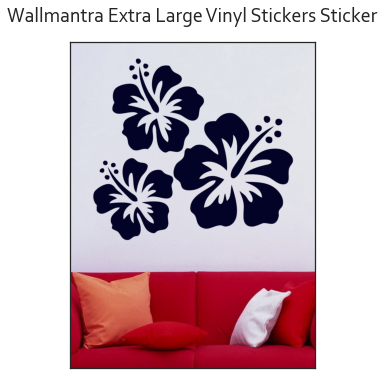

In [104]:
toolbox.display_image_from_url('./Flipkart/Images/' + stickers_.iloc[0]['image'],
                               stickers_.iloc[0]['product_name'],
                               (12, 6))

Déroulons l'arbre des catégories : 

Il y a au maximum 7 noeuds (ou sous-catégories) pour chaque produit. Essayons de déterminer au niveau de quel noeud il serait le plus approprié de couper pour définir notre cible.

In [105]:
categories = products_subset[['product_category_tree']].copy()
categories['product_category_tree'] = categories['product_category_tree'].str[2:-2]
categories['count sep'] = categories['product_category_tree'].str.count('>>')

n_cat = int(categories['count sep'].max())
cat_df = categories['product_category_tree'].str.split('>>', n=n_cat, expand=True)
cat_df.head()

,0,1,2,3,4,5,6
0,Home Furnishing,Curtains & Accessories,Curtains,Elegance Polyester Multicolor Abstract Eyelet...,None,None,None
1,Baby Care,Baby Bath & Skin,Baby Bath Towels,Sathiyas Baby Bath Towels,"Sathiyas Cotton Bath Towel (3 Bath Towel, Red...",None,None
2,Baby Care,Baby Bath & Skin,Baby Bath Towels,Eurospa Baby Bath Towels,Eurospa Cotton Terry Face Towel Set (20 PIECE...,None,None
3,Home Furnishing,Bed Linen,Bedsheets,SANTOSH ROYAL FASHION Bedsheets,SANTOSH ROYAL FASHION Cotton Printed King siz...,None,None
4,Home Furnishing,Bed Linen,Bedsheets,Jaipur Print Bedsheets,Jaipur Print Cotton Floral King sized Double ...,None,None


Affichons le nombre de valeurs uniques pour chaque sous-catégorie :

In [106]:
cat_df.nunique()

0      7
1     63
2    246
3    350
4    297
5    117
6     57
dtype: int64

Vérifions qu'il n'y a pas de déséquilibre de classe fort au niveau du premier noeud (i.e. de la catégorie principale):

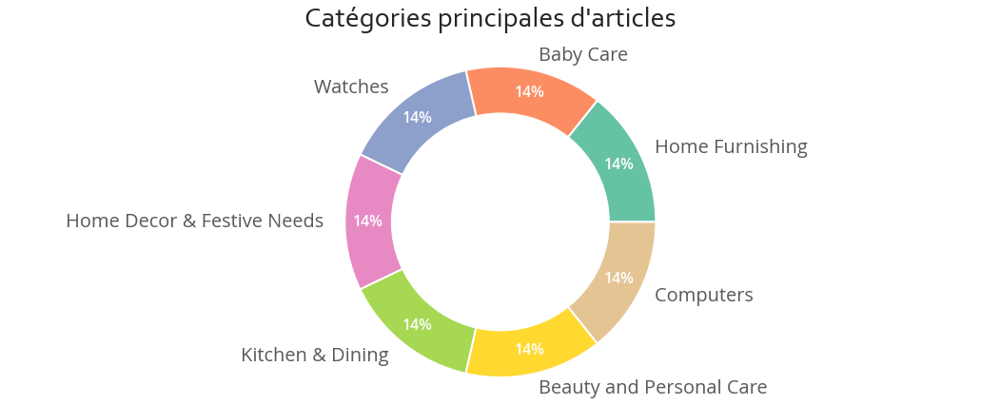

In [107]:
toolbox.plot_donut(cat_df, 0,'Catégories principales d\'articles', (15, 6))

Les 7 catégories principales sont parfaitement équilibrées dans ce jeu de données.

In [108]:
cat_df.groupby([0])[1].count()

0
Baby Care                      150
Beauty and Personal Care       150
Computers                      150
Home Decor & Festive Needs     150
Home Furnishing                150
Kitchen & Dining               150
Watches                        150
Name: 1, dtype: int64

Utiliser les autres sous-catégories nous donnerait trop de valeurs possibles différentes pour la cible. Donc nous allons utiliser la catégorie principale comme cible.

In [109]:
cat_df.groupby([0])[1].nunique()

0
Baby Care                       9
Beauty and Personal Care       11
Computers                       8
Home Decor & Festive Needs     10
Home Furnishing                12
Kitchen & Dining               11
Watches                         2
Name: 1, dtype: int64

In [110]:
pd.DataFrame(cat_df.groupby([0, 1])[2].count())

2
0                 1                                
Baby Care          Baby & Kids Gifts             15
                   Baby Bath & Skin              14
                   Baby Bedding                  15
                   Baby Grooming                  4
                   Diapering & Potty Training     7
...                                             ...
Kitchen & Dining   Lighting                       7
                   Pressure Cookers & Pans        1
                   Tableware & Cutlery            3
Watches            Clocks                         1
                   Wrist Watches                149

[63 rows x 1 columns]

Ajoutons une colonne 'target' contenant la catégorie principale de chaque produit :

In [111]:
products_subset['_target'] = products_subset['product_category_tree'].str.split('>>',
                                                                                n=1,
                                                                                expand=True)[0].str[2:-1]
products_subset[['_target']].head()

,_target
0,Home Furnishing
1,Baby Care
2,Baby Care
3,Home Furnishing
4,Home Furnishing


Il y a bien 7 valeurs possibles pour la cible, i.e. 7 classes

In [112]:
products_subset['_target'].unique()

array(['Home Furnishing', 'Baby Care', 'Watches',
       'Home Decor & Festive Needs', 'Kitchen & Dining',
       'Beauty and Personal Care', 'Computers'], dtype=object)

In [113]:
products_subset.drop(columns='product_category_tree', inplace=True)
products_subset.head()

,description,product_name,image,_target
0,Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing
1,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care
2,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,SANTOSH ROYAL FASHION Cotton Printed King size...,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing
4,Key Features of Jaipur Print Cotton Floral Kin...,Jaipur Print Cotton Floral King sized Double B...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing


<h3 style="font-family:Corbel Light; color:#737373">Prétraitement des données textuelles</h3>

Objectif : obtenir un jeu de données exploitable.

Nous allons travailler sur les 2 colonnes suivantes : 

- description 
- product_name 

<h4 style="font-family:Corbel Light; color:#737373">Exploratory Data Analysis</h4>

In [114]:
products_subset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   description   1050 non-null   object
 1   product_name  1050 non-null   object
 2   image         1050 non-null   object
 3   _target       1050 non-null   object
dtypes: object(4)
memory usage: 32.9+ KB


In [115]:
products_subset.describe()

,description,product_name,image,_target
count,1050,1050,1050,1050
unique,1050,1050,1050,7
top,Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing
freq,1,1,1,150


<h4 style="font-family:Corbel Light; color:#737373">Feature Engineering : nombre de caractères par description</h4>

Regardons la longueur des différentes descriptions

In [116]:
products_subset['_len_description'] = products_subset['description'].apply(lambda r: len(r))
products_subset.head()

,description,product_name,image,_target,_len_description
0,Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,1420
1,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,444
2,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,1258
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,SANTOSH ROYAL FASHION Cotton Printed King size...,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,858
4,Key Features of Jaipur Print Cotton Floral Kin...,Jaipur Print Cotton Floral King sized Double B...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,1197


In [117]:
products_subset.describe(include=np.number)

,_len_description
count,1_050.00
mean,473.82
std,457.91
min,109.00
25%,192.00
50%,278.00
75%,588.25
max,3_490.00


La moitié des descriptions comptent entre 190 et 590 caractères environ.

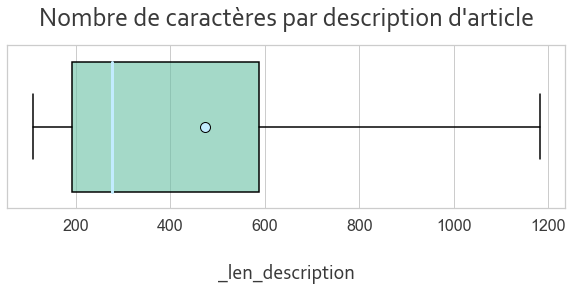

In [118]:
toolbox.plot_boxplot(products_subset,
                     '_len_description',
                     'Nombre de caractères par description d\'article',
                     (10, 3))

Les descriptions de montres et de produits de beauté semblent plus concises, tandis que les descriptions d'ordinateurs et de produits de cuisine sont bien plus longues.

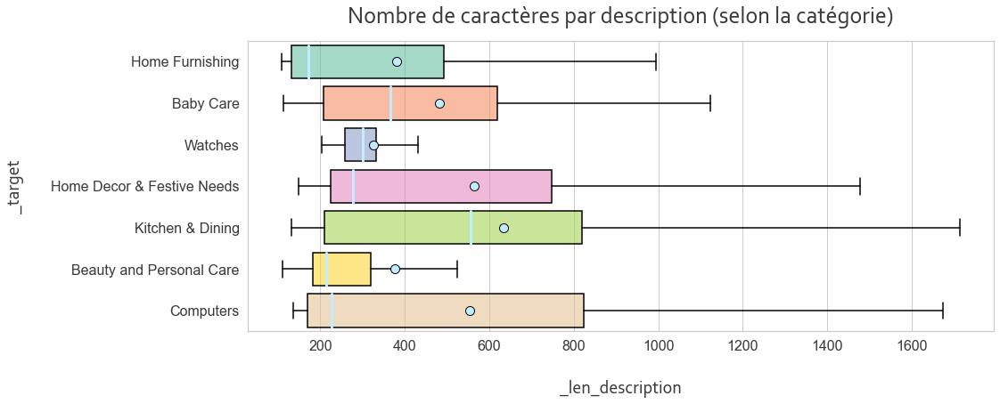

In [119]:
toolbox.plot_boxplot(products_subset,
                     '_len_description',
                     'Nombre de caractères par description (selon la catégorie)',
                     (15, 6),
                     '_target')

Utilisons le test de Kruskal-Wallis pour confirmer (ou non) que la catégorie d'un produit influence bien la longueur de sa description. Il s'agit d'un test non-paramétrique, robuste qui s'applique à la médiane. Il n'y a pas besoin de remplir des conditions préalables pour l'appliquer.

Test de Kruskal-Wallis:
- H0 : La catégorie du produit n'a aucune influence sur la longueur de la description (égalité des médianes)
- H1 : La catégorie du produit a une influence sur la longueur de sa description. (Une médiane s'écarte significativement des autres)

Niveau de test : 1%

In [120]:
st.kruskal(*[group['_len_description'].values for name,
           group in products_subset.groupby("_target")])

KruskalResult(statistic=76.19450332667887, pvalue=2.1783131410609303e-14)

p_value < 0.01 donc on peut largement rejeter H0, la catégorie aurait à priori un impact sur la longueur de la description des produits.

Il pourrait donc être intéressant d'utiliser ce feature dans une éventuelle modélisation.

Regardons la forme de la distribution de cette nouvelle variable : Beaucoup d'individus autour de 300

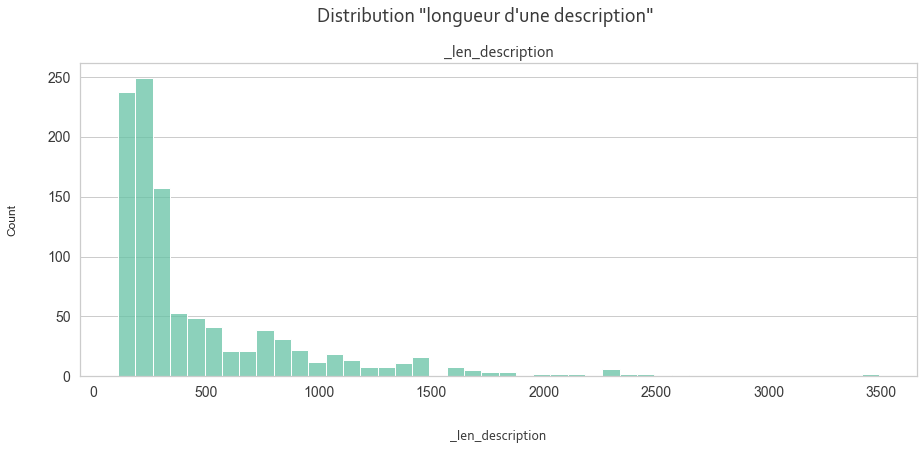

In [121]:
toolbox.display_distribution(products_subset,
                             ['_len_description'],
                             1, (15, 6),
                             suptitle='Distribution "longueur d\'une description"'
                             )

Affichons les 10 descriptions les plus courtes : essentiellement des serviettes de bain

In [122]:
products_subset.sort_values('_len_description').head(10)

,description,product_name,image,_target,_len_description
877,Buy Nkp Cotton Bath Towel at Rs. 549 at Flipka...,Nkp Cotton Bath Towel,c943647eee4de99fc1b4e233b9a7f47d.jpg,Home Furnishing,109
890,Buy IWS Cotton Bath Towel at Rs. 299 at Flipka...,IWS Cotton Bath Towel,72db37ec42ee76d79cf395221e0f4cce.jpg,Home Furnishing,109
1030,Specifications of OMRD RD6697 Hot and cold Pac...,OMRD RD6697 Hot and cold Pack,4d6bf06ef01f80130a1ab28dfdeb7aa3.jpg,Beauty and Personal Care,111
651,Buy Marvel Cotton Bath Towel at Rs. 449 at Fli...,Marvel Cotton Bath Towel,705b90361aeda1849a728d80625a78a9.jpg,Baby Care,112
892,Buy MB Cotton Set of Towels at Rs. 1195 at Fli...,MB Cotton Set of Towels,6858fd9265d348803b18667fe43cd054.jpg,Home Furnishing,112
599,Next Steps Baby Girl's Layered Dress\r\n ...,Next Steps Baby Girl's Layered Dress,84b2e623a4a4327b88f7fe197a09be31.jpg,Baby Care,112
1005,Specifications of Milani Runway shadow Wet/Dry...,Milani Runway shadow Wet/Dry Black Out 3 g,cb096f17218f0e4ccd7424963e2cd0f8.jpg,Beauty and Personal Care,113
678,Buy Neyth Cotton Set of Towels at Rs. 170 at F...,Neyth Cotton Set of Towels,22ac36ba254a68d7dd6173f099771147.jpg,Baby Care,114
874,Buy Mafatlal Cotton Bath Towel at Rs. 545 at F...,Mafatlal Cotton Bath Towel,da8017c195b3bfa4ef002968a3542707.jpg,Home Furnishing,114
884,Buy Amber Cotton Set of Towels at Rs. 239 at F...,Amber Cotton Set of Towels,d395b2f3d13ff8897f403c6141e0e39a.jpg,Home Furnishing,114


Affichons les 10 descriptions les plus longues : 

In [123]:
products_subset.sort_values('_len_description').tail(10)

,description,product_name,image,_target,_len_description
433,"Key Features of Smartpro 19.5v,3.9a Replacemen...","Smartpro 19.5v,3.9a Replacement Charger for Va...",32f24a4303050f500dec7cb3608fe089.jpg,Computers,2297
435,"Key Features of Smartpro 19.5v,3.9a Replacemen...","Smartpro 19.5v,3.9a Replacement Charger for Va...",3ccceaae844f34180708cb6cba3441bf.jpg,Computers,2298
696,Tallenge Christmas Collection - Nativity Art -...,Tallenge Christmas Collection - Nativity Art -...,82fbc93cd45ab747e7e606f2c52c7335.jpg,Home Decor & Festive Needs,2405
694,Tallenge Christmas Collection - Echoes Of Wint...,Tallenge Christmas Collection - Echoes Of Wint...,0ae859a69c7608d8197c3ba8c37bc6ec.jpg,Home Decor & Festive Needs,2409
1045,Oren Empower Extra Large Self Adhesive Sticker...,Oren Empower Extra Large Self Adhesive Sticker,958f54f4c46b53c8a0a9b8167d9140bc.jpg,Baby Care,2432
589,"Shopfloor.XYZ Vacuum Cleaner for Computers, La...","Shopfloor.XYZ Vacuum Cleaner for Computers, La...",621a88993a7033df3440ec816c2e386f.jpg,Computers,2436
916,Key Features of wallskart Floral & Botanical W...,wallskart Floral & Botanical Wallpaper,c5c559012b742d9966df82182b90c6da.jpg,Home Decor & Festive Needs,2529
715,Pioneer Pragati Floral Single Duvet Orange (1 ...,Pioneer Pragati Floral Single Duvet Orange,d68b774e9529a4b94a5c6c8943a1b8b3.jpg,Home Furnishing,2594
639,Key Features of Sunlast 16 inch Laptop Backpac...,Sunlast 16 inch Laptop Backpack,aeb421e416716d5f037d50e8c3b14cd7.jpg,Computers,3447
437,Key Features of HomeEdge Solid Wood King Bed K...,HomeEdge Solid Wood King Bed,b6c339777814451815fe7950fd4c8536.jpg,Beauty and Personal Care,3490


In [124]:
products_subset.drop(columns='_len_description', inplace=True)

In [125]:
products_subset.head(1)

,description,product_name,image,_target
0,Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing


<h4 style="font-family:Corbel Light; color:#737373">Exploration du corpus et des documents</h4>

Imprimons des descriptions au hasard pour voir si on arrive facilement ou non à déterminer la cible : 

Certaines classes semblent plus facile à prédire que d'autres (ex: pour les montres on trouve souvent le mot "watch" directement dans la description, pareil pour les accessoires bébé où les mots "baby", "boy" et "girl" reviennent souvent).

In [126]:
products_sample = products_subset.sample(10)

for idx, doc in products_sample.iterrows():
    target = f"target : {doc['_target']}\n"
    print(target + doc['description'] + "\n\n")

target : Computers
Buy Tenda A5 only for Rs. 2250 from Flipkart.com. Only Genuine Products. 30 Day Replacement Guarantee. Free Shipping. Cash On Delivery!


target : Beauty and Personal Care
Flipkart.com: Buy Adidas Ice Dive and Adidas Victory League Combo Set online only for Rs. 395 from Flipkart.com. Only Genuine Products. 30 Day Replacement Guarantee. Free Shipping. Cash On Delivery!


target : Baby Care
Key Features of FS Mini Klub Baby Girl's Bodysuit Fabric: Cotton Brand Color: GREEN,Specifications of FS Mini Klub Baby Girl's Bodysuit General Details Number of Contents in Sales Package Pack of 1 Age Group 0 -  1 month Fabric Cotton Pattern Printed Ideal For Baby Girl's Neck ROUND NECK


target : Baby Care
Key Features of FS Mini Klub Baby Boy's Bodysuit Fabric: Cotton Brand Color: MULTI,Specifications of FS Mini Klub Baby Boy's Bodysuit General Details Sleeve SHORT SLEEVE Number of Contents in Sales Package Pack of 3 Age Group 6 -  9 month Fabric Cotton Pattern Printed Ideal For 

<h4 style="font-family:Corbel Light; color:#737373">Text processing</h4>

In [127]:
raw_corpus = " ".join(products_subset.description.values)
raw_corpus[:500]

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a brig'

<h5 style="font-family:Corbel Light; color:#737373">Tokenization et suppression des stop-words</h5>

**Prétraiter des données textes - CE2 Vous avez écrit une fonction permettant de “tokeniser” une phrase.**

In [128]:
def tokenize_text(text: str):
    text = text.lower()
    tokens = RegexpTokenizer(r'[a-zA-Z0-9]{2,}').tokenize(text)

    return tokens

In [129]:
def remove_stop_words(tokens: [str], language='english', verbose=True):
    stop_words = set(stopwords.words(language))
    voc = [w for w in tokens if w not in stop_words]

    if verbose:
        voc_n = len(voc)
        print('{:_} tokens supprimés, il reste {:_} tokens'.format(
            len(tokens)-voc_n, voc_n))

    return voc

**Prétraiter des données textes - CE6 : Vous avez testé une phrase ou un court texte d'exemple, pour illustrer la bonne réalisation des étapes précédentes.**

**Phrase test**

In [130]:
test_sentence = 'Borse_N16 Make-Up And Jewellery Vanity Case at best prices, with FREE shipping & cash on delivery.!'

In [131]:
test_tokens = tokenize_text(test_sentence)
test_tokens

['borse',
 'n16',
 'make',
 'up',
 'and',
 'jewellery',
 'vanity',
 'case',
 'at',
 'best',
 'prices',
 'with',
 'free',
 'shipping',
 'cash',
 'on',
 'delivery']

In [132]:
test_tokens = remove_stop_words(test_tokens)
test_tokens

5 tokens supprimés, il reste 12 tokens


['borse',
 'n16',
 'make',
 'jewellery',
 'vanity',
 'case',
 'best',
 'prices',
 'free',
 'shipping',
 'cash',
 'delivery']

**Prétraiter des données textes - CE1: Vous avez nettoyé les champs de texte (suppression de la ponctuation et des mots de liaison, mise en minuscules)**

**Jeu de données**

In [133]:
raw_voc = tokenize_text(raw_corpus)
raw_voc = remove_stop_words(raw_voc)

18_623 tokens supprimés, il reste 59_392 tokens


<h5 style="font-family:Corbel Light; color:#737373">Lemmatisation et Racinisation</h5>

**Prétraiter des données textes - CE3: Vous avez écrit une fonction permettant de “stemmer” une phrase.**

**Prétraiter des données textes - CE4: Vous avez écrit une fonction permettant de “lemmatiser” une phrase.**

Testons la racinisation et la lemmatisation (deux méthodes pour uniformiser les mots) : 

In [134]:
def lemmatize_tokens(tokens: [str], verbose=True):
    lemmatizer = WordNetLemmatizer()
    lemmatized_text = [lemmatizer.lemmatize(i) for i in tokens]

    if verbose:
        print('Avec la lemmatisation, il reste {:_} tokens uniques'.format(
            len(set(lemmatized_text))))

    return lemmatized_text

In [135]:
def stem_tokens(tokens: [str], verbose=True):
    stemmer = PorterStemmer()
    stemmed_text = [stemmer.stem(i) for i in tokens]

    if verbose:
        print('Avec la racinisation, il reste {:_} tokens uniques'.format(
            len(set(stemmed_text))))

    return stemmed_text

**Phrase test**

In [136]:
test_lem = lemmatize_tokens(test_tokens)
test_lem

Avec la lemmatisation, il reste 12 tokens uniques


['borse',
 'n16',
 'make',
 'jewellery',
 'vanity',
 'case',
 'best',
 'price',
 'free',
 'shipping',
 'cash',
 'delivery']

In [137]:
test_stem = stem_tokens(test_tokens)
test_stem

Avec la racinisation, il reste 12 tokens uniques


['bors',
 'n16',
 'make',
 'jewelleri',
 'vaniti',
 'case',
 'best',
 'price',
 'free',
 'ship',
 'cash',
 'deliveri']

**Jeu de données**

In [138]:
print('{:_} tokens uniques'.format(len(set(raw_voc))))

5_937 tokens uniques


In [139]:
l = lemmatize_tokens(raw_voc)

Avec la lemmatisation, il reste 5_522 tokens uniques


In [140]:
s = stem_tokens(raw_voc)

Avec la racinisation, il reste 4_953 tokens uniques


<h4 style="font-family:Corbel Light; color:#737373">Etude du vocabulaire du corpus</h4>

In [141]:
voc_counts = pd.Series(raw_voc).value_counts()

Regardons les 10 tokens les plus utilisés : 

Beaucoup de mots assez bateau (tels que "buy", "delivery", "cash", "free"), surtout liés à la vente en ligne et qui n'ont aucun rapport avec les catégories d'articles.

In [142]:
voc_counts.head(10)

rs             911
products       631
free           618
buy            581
delivery       567
genuine        564
shipping       564
cash           564
replacement    559
cm             543
dtype: int64

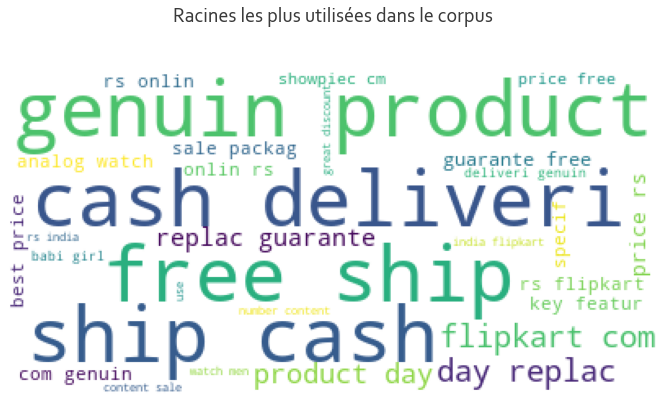

In [143]:
toolbox.display_wordcloud(s, 'Racines les plus utilisées dans le corpus')

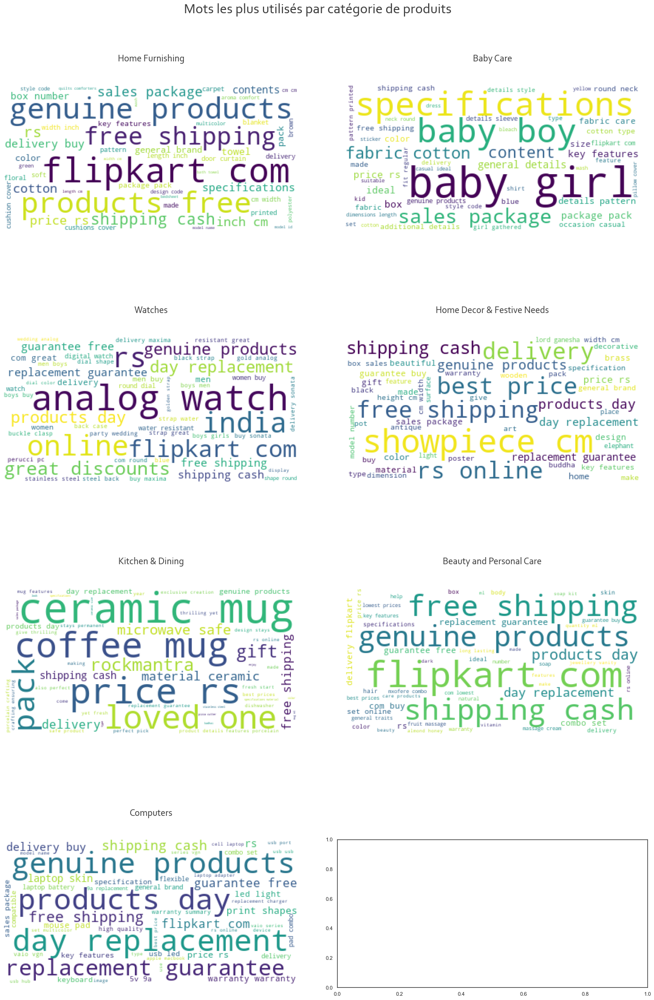

In [144]:
toolbox.display_wordcloud_by_label(products_subset, '_target', 'description', 2, (20, 30), 'par catégorie de produits')

Regardons les mots très utilisés dans plusieurs classes et donc moins utiles pour identifier une classe en particulier.

In [145]:
description_stopwords = toolbox.get_most_used_words(30, 2,
                                                    products_subset,
                                                    '_target',
                                                    'description'
                                                    )
description_stopwords.head(10)

23 tokens parmi les 30 tokens les plus utilisés dans plus de 2 classes


,words,labels_n
0,product,7
1,r,7
2,price,6
3,buy,6
4,free,6
5,ship,5
6,cash,5
7,featur,5
8,day,5
9,deliveri,5


De même pour les noms de produits : il y en a très peu

In [146]:
name_stopwords = toolbox.get_most_used_words(30, 2, 
                                             products_subset, 
                                             '_target', 
                                             'product_name'
                                            )
name_stopwords

5 tokens parmi les 30 tokens les plus utilisés dans plus de 2 classes


,words,labels_n
0,set,6
1,print,3
2,design,3
3,sticker,3
4,gift,3


Regardons les 15 tokens les moins utilisés :

In [147]:
voc_counts.tail(15)

turtle       1
1183         1
girlie       1
479          1
onboard      1
royalblue    1
burning      1
galaxy       1
cpu          1
driver       1
cd           1
374          1
656          1
motif        1
enriched     1
dtype: int64

50% des mots sont utilisés 2 fois ou moins.

In [148]:
voc_counts.describe()

count   5_937.00
mean       10.00
std        38.84
min         1.00
25%         1.00
50%         2.00
75%         5.00
max       911.00
dtype: float64

On pourrait considérer que si nos tokens sont présents seulement une ou deux fois sur l'ensemble du corpus, alors ils ne sont pas très utiles. En effet, il y a de de grandes chances pour :
- qu'ils soient éliminés lors des réductions de dimensionnalité
- qu'ils ne puissent pas être utilisés comme dimension

In [149]:
description_uncommon_tokens = toolbox.get_uncommon_tokens(raw_voc, 5)

4_470 tokens utilisés 5 fois ou moins


In [150]:
raw_voc_name = tokenize_text(" ".join(products_subset['product_name'].values))
raw_voc_name = remove_stop_words(raw_voc_name)
name_uncommon_tokens = toolbox.get_uncommon_tokens(raw_voc_name, 5) 

386 tokens supprimés, il reste 6_928 tokens
2_095 tokens utilisés 5 fois ou moins


<h4 style="font-family:Corbel Light; color:#737373">Nettoyage Final</h4>

Pour chaque document du corpus (descriptions et/ou noms de produits), on va :
- mettre en minuscule, supprimer la ponctuation et tokeniser
- supprimer les stopwords
- lemmatiser
- raciniser

In [151]:
def cleaning(doc: str, drop_corpus_stopwords=False, corpus_stopwords=None,
             drop_uncommon_tokens=False, uncommon_tokens=None, joined=True):
    tokens = tokenize_text(doc)
    tokens = remove_stop_words(tokens, verbose=False)
    tokens = lemmatize_tokens(tokens, verbose=False)
    tokens = stem_tokens(tokens, verbose=False)

    if drop_corpus_stopwords:
        tokens = [w for w in tokens if w not in corpus_stopwords['words'].values]
    if drop_uncommon_tokens:
        tokens = [w for w in tokens if w not in uncommon_tokens]

    if joined:
        cleaned_doc = ' '.join(tokens)
    else:
        cleaned_doc = tokens

    return cleaned_doc

In [152]:
%%time
products_subset['_description_cleaned'] = products_subset['description'].apply(lambda d:
                                                                               cleaning(d,
                                                                                        True,
                                                                                        description_stopwords,
                                                                                        True,
                                                                                        description_uncommon_tokens)
                                                                               )

products_subset['_name_cleaned'] = products_subset['product_name'].apply(lambda d:
                                                                         cleaning(d)
                                                                         )

CPU times: total: 12.4 s
Wall time: 13 s


Ajoutons des colonnes contenant la concaténation description + nom pour chaque article :

In [153]:
products_subset['_name_and_description'] = products_subset['product_name'] + \
    ' ' + products_subset['description']
products_subset['_name_and_description_cleaned'] = products_subset['_name_cleaned'] + \
    products_subset['_description_cleaned']

In [154]:
products_subset.head()

,description,product_name,image,_target,_description_cleaned,_name_cleaned,_name_and_description,_name_and_description_cleaned
0,Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,key eleg polyest multicolor abstract eyelet do...,eleg polyest multicolor abstract eyelet door c...,Elegance Polyester Multicolor Abstract Eyelet ...,eleg polyest multicolor abstract eyelet door c...
1,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,sathiya cotton bath towel bath towel red yello...,sathiya cotton bath towel,Sathiyas Cotton Bath Towel Specifications of S...,sathiya cotton bath towelsathiya cotton bath t...
2,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,key eurospa cotton terri face towel set size s...,eurospa cotton terri face towel set,Eurospa Cotton Terry Face Towel Set Key Featur...,eurospa cotton terri face towel setkey eurospa...
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,SANTOSH ROYAL FASHION Cotton Printed King size...,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,key santosh royal fashion cotton king size dou...,santosh royal fashion cotton print king size d...,SANTOSH ROYAL FASHION Cotton Printed King size...,santosh royal fashion cotton print king size d...
4,Key Features of Jaipur Print Cotton Floral Kin...,Jaipur Print Cotton Floral King sized Double B...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,key jaipur cotton floral king size doubl bedsh...,jaipur print cotton floral king size doubl bed...,Jaipur Print Cotton Floral King sized Double B...,jaipur print cotton floral king size doubl bed...


Enregistrons les données nettoyées :

In [155]:
products_subset.to_pickle('products_data_cleaned.pkl')

On peut regarder de nouveau les tokens les plus utilisés par classe, après nettoyage:

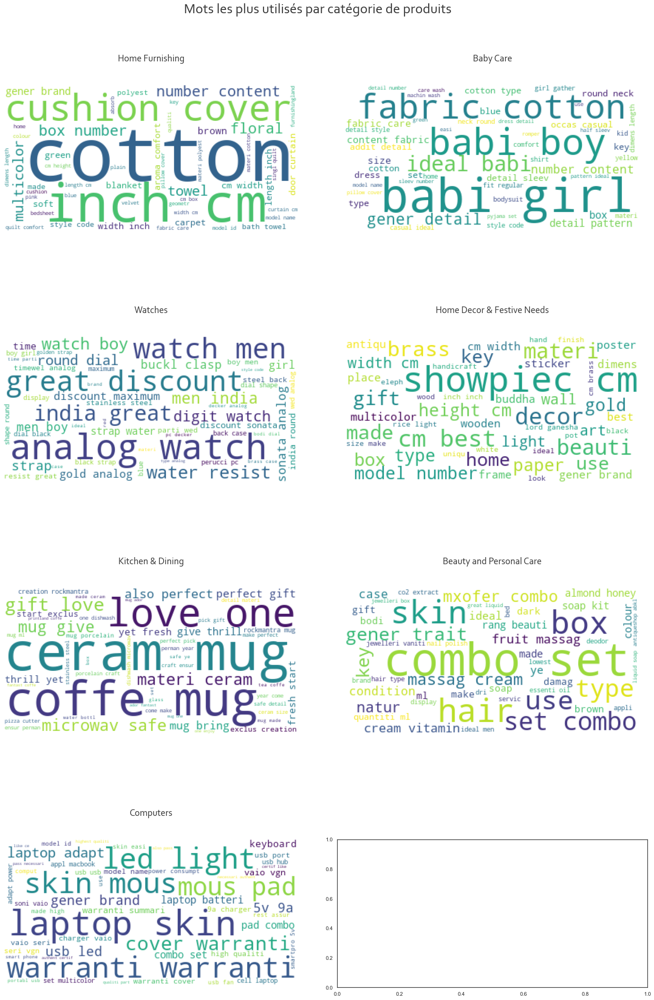

In [156]:
toolbox.display_wordcloud_by_label(products_subset, '_target', '_description_cleaned', 2, (20, 30), 'par catégorie de produits')

<h3 style="font-family:Corbel Light; color:#737373">Méthodes de comptage direct : bag of words</h3>

**Prétraiter des données textes - CE5 : Vous avez construit des features ("feature engineering") de type bag-of-words (bag-of-words standard : comptage de mots, et Tf-idf), avec des étapes de nettoyage supplémentaires : seuil de fréquence des mots, normalisation des mots.**

Objectif : représenter chaque document par un vecteur de la taille du vocabulaire

<h4 style="font-family:Corbel Light; color:#737373">Tf : Term Frequency</h4>

On va tester trois combinaisons de features : 

- entrainer sur la description seule
- entrainer sur le nom du produit seul
- entrainer sur la description + le nom du produit

<h5 style="font-family:Corbel Light; color:#737373">Extraction de features</h5>

Commençons par travailler uniquement avec la description :

In [157]:
tf_vectorizer_description = CountVectorizer(max_df=0.95, min_df=2)
tf_description = tf_vectorizer_description.fit_transform(products_subset['_description_cleaned'])

In [158]:
tf_description.shape

(1050, 1489)

In [159]:
print(tf_description.toarray())

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 2 0]
 [0 0 0 ... 1 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


Vérifions pour un document au hasard que ce que l'on obtient est cohérent :

In [160]:
doc = products_subset.sample(1)
doc

,description,product_name,image,_target,_description_cleaned,_name_cleaned,_name_and_description,_name_and_description_cleaned
724,Buy Flazee Home Trends Beige 144.78 cm Table R...,Flazee Home Trends Beige 144.78 cm Table Runner,00cbbc837d340fa163d11e169fbdb952.jpg,Home Furnishing,flaze home beig cm tabl runner 399,flaze home trend beig 144 78 cm tabl runner,Flazee Home Trends Beige 144.78 cm Table Runne...,flaze home trend beig 144 78 cm tabl runnerfla...


In [161]:
features = tf_vectorizer_description.get_feature_names_out()
count_df = toolbox.count_vector_to_df(tf_description.toarray()[doc.index.values[0]],
                                      10, features
                                      )

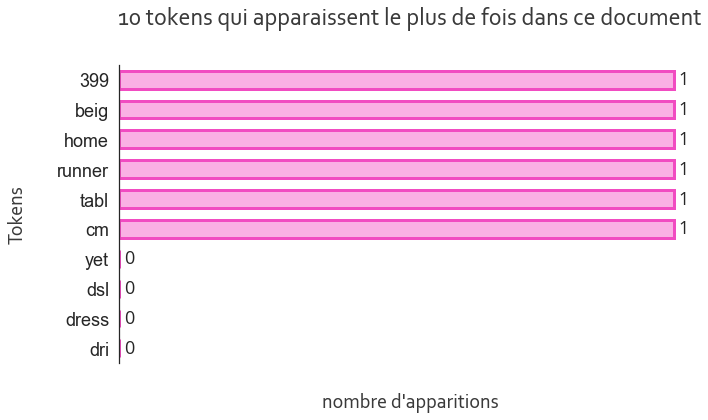

In [162]:
color = sns.color_palette("pastel", 8)[6]
edgecolor = sns.color_palette("bright", 8)[6]

titles = {'chart_title': '10 tokens qui apparaissent le plus de fois dans ce document',
          'x_title': 'nombre d\'apparitions',
          'y_title': 'Tokens'}

toolbox.display_barplot(count_df, 'count', 'token',
                        color, titles, (10, 6),
                        edgecolor
                        )

Entrainons notre modèle sur la description et le nom du produit

In [163]:
tf_vectorizer_description_name = CountVectorizer(max_df=0.95, min_df=2)
tf_description_name = tf_vectorizer_description_name.fit_transform(products_subset['_name_and_description_cleaned'])
tf_description_name.shape

(1050, 1785)

On retrouve les mêmes tokens, certains apparaissent plus de fois (car présents à la fois dans le nom du produit et dans la description)

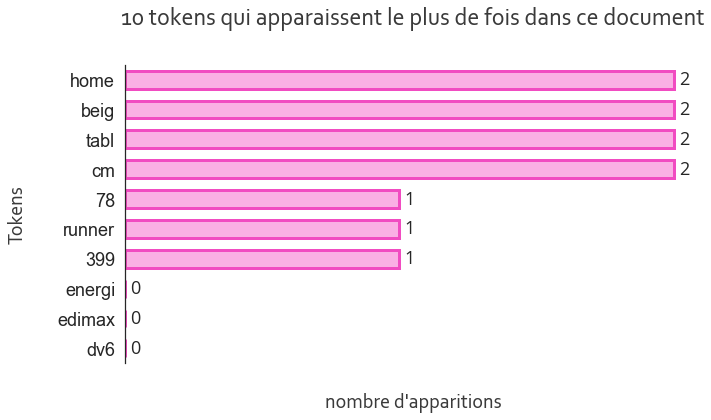

In [164]:
features = tf_vectorizer_description_name.get_feature_names_out()
count_df = toolbox.count_vector_to_df(tf_description_name.toarray()[doc.index.values[0]],
                                      10, features
                                      )
toolbox.display_barplot(count_df, 'count', 'token',
                        color, titles, (10, 6),
                        edgecolor
                        )

Enfin on va entrainer le modèle sur les noms de produits (un vocabulaire plus précis/plus fort) et l'appliquer à la fois au nom et à la description du produit : 

On obtient une matrice avec moins de tokens

In [165]:
tf_vectorizer_name = CountVectorizer(max_df=0.95, min_df=2)
tf_vectorizer_name.fit(products_subset['_name_cleaned'])

tf_name_description = tf_vectorizer_name.transform(products_subset['_name_and_description_cleaned'])
tf_name_description.shape

(1050, 744)

Les mots clés, qui permettent d'attribuer une catégorie au produit,sont bien conservés

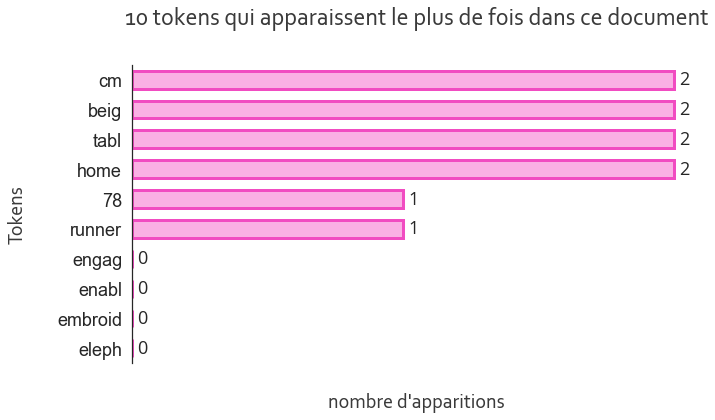

In [166]:
features = tf_vectorizer_name.get_feature_names_out()
count_df = toolbox.count_vector_to_df(tf_name_description.toarray()[doc.index.values[0]],
                                      10, features
                                      )

toolbox.display_barplot(count_df, 'count', 'token',
                        color, titles, (10, 6), edgecolor)

<h5 style="font-family:Corbel Light; color:#737373">Visualisation en 2 dimensions</h5>

**Réduction dimension - CE1: Vous avez justifié la nécessité de la réduction de dimension.**

Nous avons besoin de réduire la dimension de nos données pour les visualiser. Cette réduction de dimension va se faire en deux étapes : 

- 1ère étape : application d'une technique linéaire de réduction de dimension aux features extraites (ACP si matrice dense, SVD si matrice creuse) afin de réduire les temps de calcul et d'améliorer la qualité du modèle d'apprentissage (KMeans). Ne garder que les features pertinentes (i.e. qui expliquent au moins 80% de variance) nous permettra de limiter le surapprentissage du modèle et d'éviter de trop l'induire en erreur en introduisant du bruit.

- 2ème étape : application d'une technique de réduction dimensionnelle non linéaire (t-SNE) afin de visualiser nos données en 2D et de repérer des caractéristiques locales intéressantes du phénomène. En effet, l'algorithme du t-SNE conserve le plus possible le clustering d'origine dans l'espace de dimension inférieure.

Une fois nos données représentées par 2 variables nous appliquerons un algorithme du KMeans à 7 clusters (correspondant à nos 7 catégories de produits) et regarderons si ce dernier arrive facilement à regrouper les articles d'une même classe. 

Nous allons également calculer un score de similarité, l'indice de rand ajusté, qui permettra d'évaluer la concordance de ces deux partitions (étiquettes réelles vs clusters trouvés par le KMeans). Plus cet indice sera proche de 1, plus le clustering correspondra parfaitement à la partition initiale. 

In [167]:
models_tf = [{'data': tf_description,
              'title': 'descriptions',
              'model': 'fit_transform description', 
              'n_components': 244},
             {'data': tf_description_name,
              'title': 'noms+descriptions',
              'model': 'fit_transform description + name', 
              'n_components': 200},
             {'data': tf_name_description,
              'title': 'noms+descriptions',
              'model': 'fit name, transform description + name', 
              'n_components': 100}
             ]

**Réduction dimension - CE2 Vous avez appliqué une méthode de réduction de dimension adaptée à la problématique (ex. : ACP).**

Notre matrice de features est creuse donc on ne peut appliquer la méthode ACP, on va plutôt appliquer la méthode SVD.

**Réduction dimension - CE3 Vous avez justifié le choix des valeurs des paramètres dans la méthode de réduction de dimension retenue (ex : le nombre de dimensions conservées pour l'ACP).**

On choisit un nombre de composantes qui permette d'expliquer au moins 80% de la variance du phénomène observé, afin de bien réduire le nombre de features (et donc le bruit) sans perdre trop d'informations.
- modèle 1 (fit_description) : on passe de 1489 features à 244
- modèle 2 (fit_name + description) : on passe de 1785 à 200 features
- modèle 3 (fit_name) : on passe de 744 à 100 features

Remarque : en jouant avec le nombre de nouvelles composantes pour chaque modèle on améliore les résultats. Par exemple, le second modèle (entraîné à la fois sur le nom et la description des articles) donne un meilleur score ARI avec seulement 200 composantes (qui expliquent 90% de la variance du modèle). Le premier modèle (entrainé sur la description seule) donne un meilleur résultat avec un nombre de composantes plus élevé qui expliquent 95% de la variance. Enfin, on peut améliorer le score du troisième modèle (entrainé sur les noms de produits) en réduisant encore le nombre de nouvelles features à 100 (qui n'expliquent que 82% de la variance). 

**Représenter des données à grandes dimensions - CE1 : Vous avez mis en œuvre au moins une technique de réduction de dimension (via LDA, ACP, T-SNE, UMAP ou autre technique).**

**Représenter des données à grandes dimensions - CE2 : Vous avez réalisé au moins un graphique représentant les données réduites en 2D (par exemple affichage des 2 composantes du T-SNE).**

95.02% de variance expliquée par les 244 premières composantes ensembles
90.63% de variance expliquée par toutes les composantes ensembles
82.27% de variance expliquée par toutes les composantes ensembles


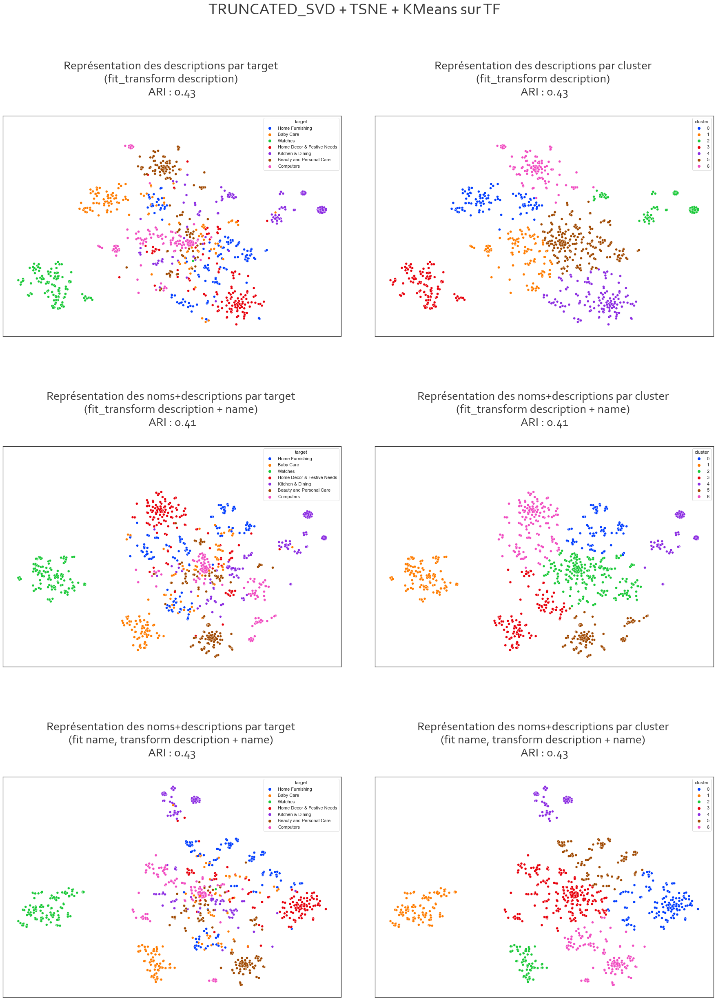

In [168]:
tf_reduced = toolbox.display_vizu_many(toolbox.LinearDimReduction.TRUNCATED_SVD,
                                       models_tf,
                                       products_subset['_target'],
                                       (25, 35),
                                       ' sur TF',
                                       top=0.87, hspace=.5, verbose=True,
                                       var_explained_svd=0.95)

**Représenter des données à grandes dimensions - CE3 : Vous avez réalisé et formalisé une analyse du graphique en 2D.**

Analyse : 

Les features utilisées permettent assez facilement au modèle de regrouper les montres en un cluster bien distinct des autres (cluster vert à gauche, sur les graphiques de la colonne de gauche).

On obtient des scores ARI qui varient autour de 0.4 en fonction du nombre de composantes retenu lors de la réduction de dimension. Aucun des 3 modèles testés ne semble beaucoup surpasser les autres.

<h5 style="font-family:Corbel Light; color:#737373">Matrices de confusion</h5>

Affichons les matrices de confusions obtenues en utilisant nos 3 matrices de features :

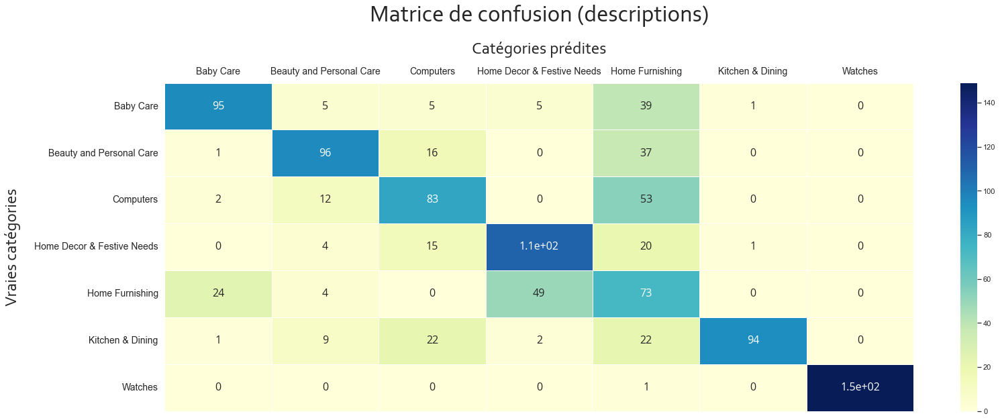

In [169]:
data_des = tf_reduced['fit_transform description']
data_des = data_des.rename(columns={"cluster": 'pred'})
toolbox.plot_confusion_matrix(data_des, (25, 9),
                              add_label=True,
                              title=' (descriptions)'
                              )

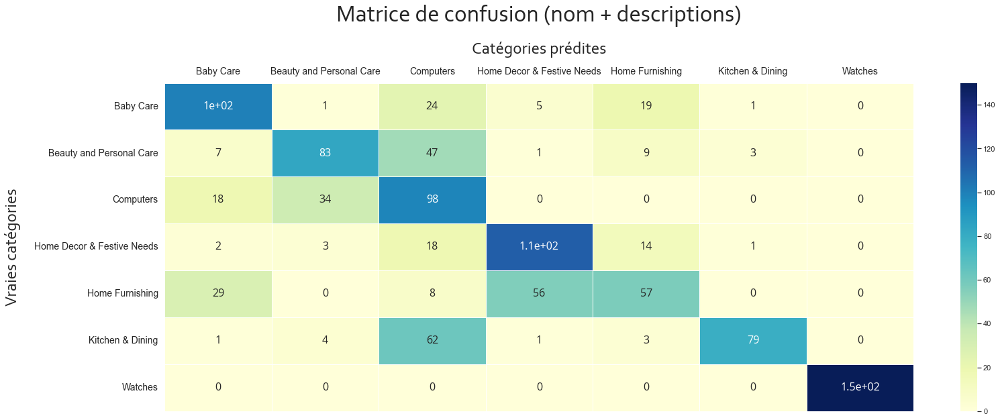

In [170]:
data_name_des = tf_reduced['fit_transform description + name']
data_name_des = data_name_des.rename(columns={"cluster": 'pred'})
toolbox.plot_confusion_matrix(data_name_des, (25, 9),
                              add_label=True,
                              title=' (nom + descriptions)'
                              )

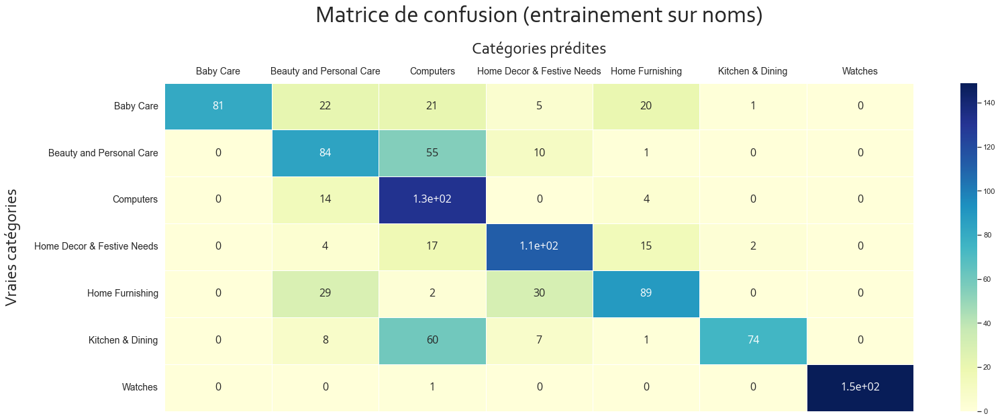

In [171]:
data_name = tf_reduced['fit name, transform description + name']
data_name = data_name.rename(columns={"cluster": 'pred'})
toolbox.plot_confusion_matrix(data_name, (25, 9),
                              add_label=True,
                              title=' (entrainement sur noms)'
                              )

Les principales erreurs faites par ces modèles sont :
- produits "Computers" classés en "Home Furnishing" (pour les features basées sur les descriptions - modèle 1)
- produits "Home Furnishing" classés en "Home Decor and Festive Needs" (modèle 1, 2)
- produits "Kitchen & Dining" classés en "Computers" (modèle 2, 3)
- produits "Beauty and Personal Care" en "Computers" (modèle 2, 3)

In [172]:
#Exemples de produits ordinateurs classés en meubles maison : peut-être à cause des champs lexicaux suivants
# qualiti, clean, fabric, noms de couleurs (black, dark, multicolor), descriptions de textures (smooth, glossi), 
# dimensons (weight, length, height , mm, cm)

mismatch = data_des.loc[(data_des['target']=="Computers") & (data_des['pred']==5)]
print(products_subset['_description_cleaned'][mismatch.index][:5].values)

['key graphic rich 3d audio video captur complet attent good understand easili video well complet learn modul learn manag softwar help improv learn outcom complet comprehens coverag class pen drive 999 premium class scienc board high qualiti 3d learn content sure help improv perform exam also help solid foundat futur learn challeng gener scienc mathemat brand class high qualiti 3d anim video interact 3d simul interact learn link mani attract type medium model name class educ board secondari educ board subscript year model id gb high qualiti 3d anim video interact 3d simul interact learn link mani attract system requir memori gb oper system window 32 window 32 window 32 requir graphic card geforc compat sound card sound card gb per hard drive 32 gb processor core processor 86'
 '310 black black compat consist high qualiti high yield dark brand new iso qualiti certifi compat consist high qualiti high yield dark brand new iso qualiti certifi'
 'key frenemi mousepad smooth surfac finish qu

In [173]:
#Exemples de produits de cuisine classés en ordinateur : peut-être à cause des nombres présents dans leur nom

mismatch = data_name.loc[(data_name['target']=="Kitchen & Dining") & (data_name['pred']==3)]
print(products_subset['product_name'][mismatch.index][:5])

38                    BFT 6 W LED Bulb
72     Garnet Traveller 1500 ml Bottle
113      Omic Poto-Blue 1000 ml Sipper
192          Famous Wheel Pizza Cutter
197           Sam Rolling Pizza Cutter
Name: product_name, dtype: object


In [174]:
# Exemples de produits de beauté classés en ordinateur : peut-être à cause des mots lcd, repair, computrised

mismatch = data_name.loc[(data_name['target'] == "Beauty and Personal Care") & (data_name['pred'] == 3)]
display(products_subset['product_name'][mismatch.index][:5])

43     Burt s Bees Hair Repair Shea And Grapefruit De...
49       Suave Naturals Everlasting Sunshine Conditioner
77              Giorgio Armani SMOOTH SILK LIP PENCIL 12
124    SOS COMPUTRISED LCD INTRFERENTIAL UNIT-125PROG...
125    Sally Hansen La Cross 5 Pcs Festival Grooming Kit
Name: product_name, dtype: object

<h4 style="font-family:Corbel Light; color:#737373">Tf-idf : Term Frequency - Inverse Document Frequency</h4>

<h5 style="font-family:Corbel Light; color:#737373">Extraction de features</h5>

Entrainement sur la description seule :

In [175]:
tfidf_vectorizer_description = TfidfVectorizer(max_df=0.95, min_df=2)
tfidf_description = tfidf_vectorizer_description.fit_transform(products_subset['_description_cleaned'])
tfidf_description.shape

(1050, 1489)

In [176]:
print(tfidf_description.toarray())

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.19857399 0.        ]
 [0.         0.         0.         ... 0.04487167 0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


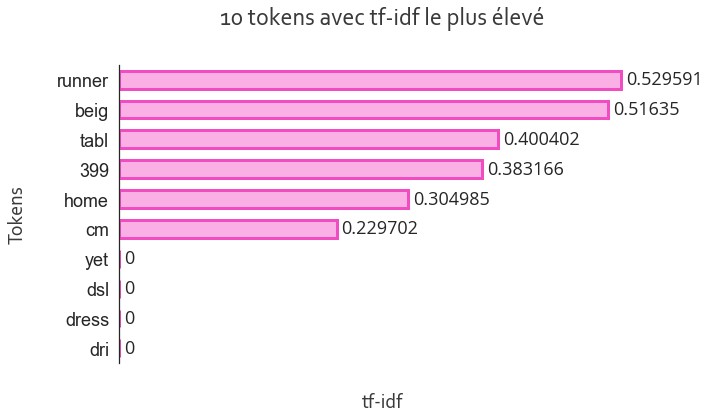

In [177]:
titles = {'chart_title': '10 tokens avec tf-idf le plus élevé',
          'x_title': 'tf-idf',
          'y_title': 'Tokens'}

features = tfidf_vectorizer_description.get_feature_names_out()
count_df = toolbox.count_vector_to_df(tfidf_description.toarray()[doc.index.values[0]],
                                      10, features)

toolbox.display_barplot(count_df, 'count', 'token',
                        color, titles, (10, 6), edgecolor
                        )

Entrainement sur nom + description :

In [178]:
tfidf_vectorizer_description_name = TfidfVectorizer(max_df=0.95, min_df=2)
tfidf_description_name = tfidf_vectorizer_description_name.fit_transform(products_subset['_name_and_description_cleaned'])
tfidf_description_name.shape

(1050, 1785)

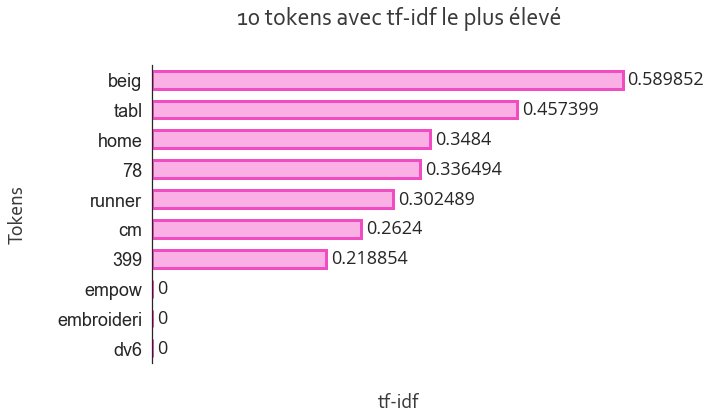

In [179]:
features = tfidf_vectorizer_description_name.get_feature_names_out()
count_df = toolbox.count_vector_to_df(tfidf_description_name.toarray()[
                                      doc.index.values[0]], 10, features)

toolbox.display_barplot(count_df, 'count', 'token',
                        color, titles, (10, 6), edgecolor)

Entrainement uniquement sur les noms de produits :

In [180]:
tfidf_vectorizer_name = TfidfVectorizer(max_df=0.95, min_df=2)
tfidf_vectorizer_name.fit(products_subset['_name_cleaned'])

tfidf_name_description = tfidf_vectorizer_name.transform(products_subset['_name_and_description_cleaned'])
tfidf_name_description.shape

(1050, 744)

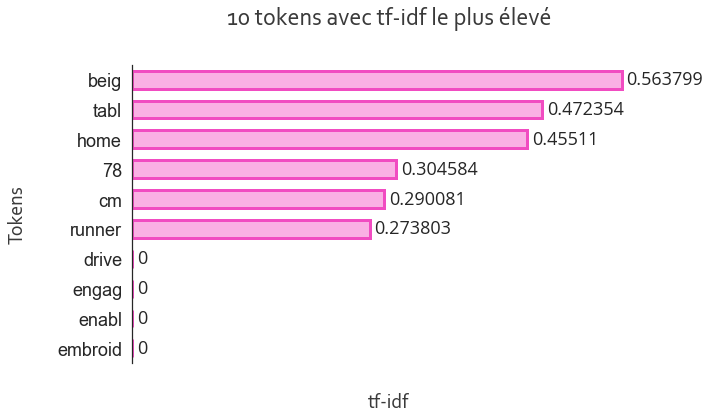

In [181]:
features = tfidf_vectorizer_name.get_feature_names_out()
count_df = toolbox.count_vector_to_df(tfidf_name_description.toarray()[
                                      doc.index.values[0]], 10, features)

toolbox.display_barplot(count_df, 'count', 'token',
                        color, titles, (10, 6), edgecolor)

<h5 style="font-family:Corbel Light; color:#737373">Visualisation en 2 dimensions</h5>

Pour chaque modèle on retient un nombre de composantes qui explique au moins 80% de la variance :
- modèle 1 (fit_description) : on passe de 1489 à 500 features
- modèle 2 (fit_name+description) : on passe de 1785 à 300 features
- modèle 3 (fit_name) : on passe de 744 à 200 features

In [182]:
models_tfidf = [{'data': tfidf_description,
                 'title': 'descriptions',
                 'model': 'fit_transform description', 
                 'n_components': 500},
                {'data': tfidf_description_name,
                 'title': 'noms+descriptions',
                 'model': 'fit_transform description + name', 
                 'n_components': 300},
                {'data': tfidf_name_description,
                 'title': 'noms+descriptions',
                 'model': 'fit name, transform description + name', 
                 'n_components': 200}
                ]

On obtient de meilleurs résultats que précédemment avec des scores ARI plutôt autour de 0.5 (vs 0.4 avec les features tf).

Comme précédemment, la catégorie des 'montres' (en vert sur les 3 graphiques de gauche) est la catégorie de produits qui se distingue le mieux visuellement des autres clusters. 
On arrive aussi à mieux repérer les autres groupes d'articles. Il semble y avoir un peu moins de points de toutes les couleurs mélangés au milieu de chaque graphique.

95.03% de variance expliquée par les 444 premières composantes ensembles
84.33% de variance expliquée par toutes les composantes ensembles
82.11% de variance expliquée par toutes les composantes ensembles


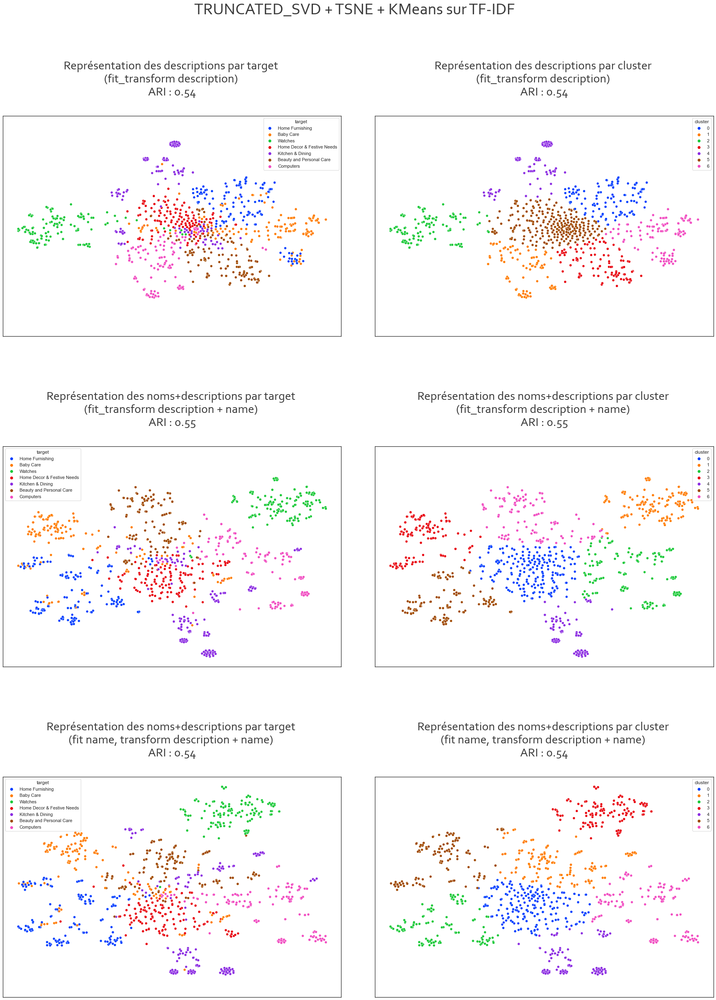

In [183]:
tfidf_reduced = toolbox.display_vizu_many(toolbox.LinearDimReduction.TRUNCATED_SVD,
                                          models_tfidf, products_subset['_target'], 
                                          (25, 35), ' sur TF-IDF', 
                                          top=0.87, hspace=.5, 
                                          verbose=True, 
                                          var_explained_svd = .95
                                         )

<h5 style="font-family:Corbel Light; color:#737373">Matrices de confusion</h5>

Modèle 1 : entrainé uniquement sur les descriptions

Avec les features obtenues par la méthode Tf, le modèle avait surtout tendance à classer par erreur beaucoup de produits dans la catégorie "Home Furnishing", en particulier des produits de la catégorie "computers". On voit ici que ce n'est plus le cas, on passe de 53 produits "computers" classés par erreur en "Home Furnishing" à 0. 

Par contre, ce modèle semble avoir plus de mal avec la classe 'Home Decor & Festive Needs" dans laquelle il classe beaucoup d'articles à tort. En effet, on voit sur le graphique 2D que les articles "Home Decor & Festive Needs", en rouge, se trouvent plutôt au centre et sont assez mélangés avec les autres catégories.

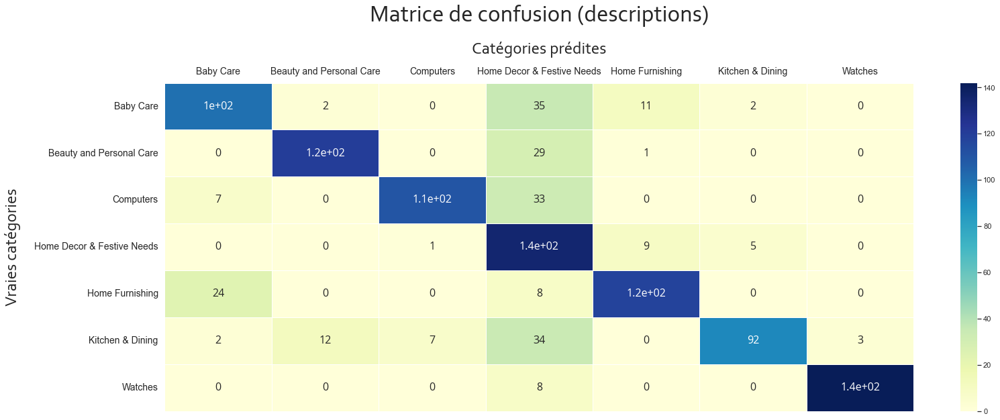

In [184]:
data_des2 = tfidf_reduced['fit_transform description']
data_des2 = data_des2.rename(columns={"cluster": 'pred'})

toolbox.plot_confusion_matrix(data_des2, (25, 9),
                              add_label=True,
                              title=' (descriptions)'
                              )

In [185]:
#Exemple d'articles classés en "Home Decor & Festive Needs" par erreur: peut-être à cause des mots "gift", "play" ...

mismatch = data_des2.loc[(data_des2['target']=="Baby Care") & (data_des2['pred']==5)]
print(products_subset['_description_cleaned'][mismatch.index][:5].values)

['key wine bag yellow easi carri giftbag jutebag bob wine bag yellow yellow gener brand insul type bottl cover seri wine bag materi washabl ye model name wine bag yellow ideal boy girl model id yellow size larg box number content bottl cover addit easi carri giftbag jutebag bob'
 'cozi mattress set multi babi mattress materi cotton gener brand type waterproof model name cozi mattress set pattern plain model id multi addit soft comfort waterproof set colour may vari box mattress'
 'kid cotton pad net multicolour conveni washabl ye gener brand kid model name cotton pad capac model id multicolour dimens weight 100 height 36 inch width 18 inch box net'
 'play shade inflat play play shade inflat play best'
 'green chang tabl gener brand model number tab shade green model name green bodi chang pad includ safeti strap includ materi plastic wheel includ dimens weight kg height 21 cm width 12 cm depth 12 cm box chang tabl addit easili use']


Modèle 2 : entrainé sur nom + description

Avec les features obtenues par la méthode Tf, le modèle classait beaucoup d'articles "Kitchen & Dining" et "Beauty and Personal Care" dans la catégorie "Computers". C'est moins le cas ici. On passe de 47 à 0 articles de beauté classés comme "computers" et de 62 articles de cuisine classés comme "computers" à 27. 

Cependant, tout comme le modèle 1 ci-dessus, ce modèle a tendance à classer à tort beaucoup d'articles dans la catégorie "Home Decor & Festive Needs".

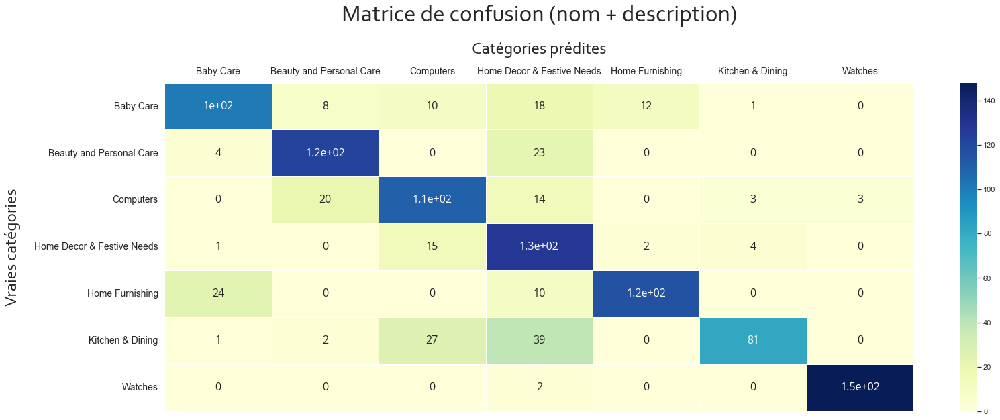

In [186]:
data_name_des2 = tfidf_reduced['fit_transform description + name']
data_name_des2 = data_name_des2.rename(columns={"cluster": 'pred'})

toolbox.plot_confusion_matrix(data_name_des2, (25, 9),
                              add_label=True,
                              title=' (nom + description)'
                              )

In [187]:
#Exemple d'articles classés en "Home Decor & Festive Needs" par erreur: peut-être à cause des mots "eleg", "handmade" ...

mismatch = data_name_des2.loc[(data_name_des2['target']=="Kitchen & Dining") & (data_name_des2['pred']==0)]
print(products_subset['_name_cleaned'][mismatch.index][:5].values)

['dungri india craft ducjug010 ducgl012 jug glass set'
 'cookart eleg handi hot pot pack casserol set'
 'caffein handmad tribal print influenc katori bowl set stonewar bowl set'
 'garnet travel 1500 ml bottl' 'oxford tawa 15 cm cm diamet']


Modèle 3 : entrainé sur les noms de produits 

Avec les features obtenues par la méthode Tf, ce modèle classait aussi beaucoup d'articles "Beauty and Personal Care" et "Kitchen & Dining" en "Computers". Ce qui n'est plus le cas ici. On passe de 55 articles de beauté classés comme "computers" à 12 et de 60 à 7 articles de cuisines classés comme "computers". 

Cependant, ce modèle semble avoir également plus de mal avec la catégorie "Home Decor & Festive Needs" dans laquelle il classe à tort beaucoup d'articles appartenant à d'autres catégories. De plus, 51 articles de cuisine sont maintenant classés comme articles de beauté (contre 8 dans le modèle tf).

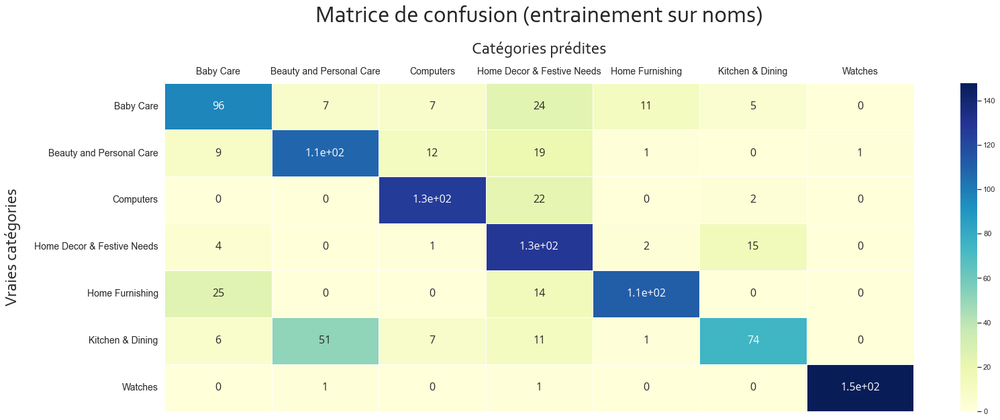

In [188]:
data_name2 = tfidf_reduced['fit name, transform description + name']
data_name2 = data_name2.rename(columns={"cluster": 'pred'})

toolbox.plot_confusion_matrix(data_name2, (25, 9),
                              add_label=True,
                              title=' (entrainement sur noms)'
                              )

In [189]:
#Exemple d'articles de cuisine classés par erreur en produits de beauté: peut-être à cause des mots "cutter", ...

mismatch = data_name2.loc[(data_name2['target']=="Kitchen & Dining") & (data_name2['pred']==1)]
print(mismatch.shape)
print(products_subset['_name_cleaned'][mismatch.index][:10].values)

(51, 6)
['dungri india craft ducjug010 ducgl012 jug glass set'
 'cookart eleg handi hot pot pack casserol set'
 'garnet travel 1500 ml bottl' 'omic poto blue 1000 ml sipper'
 'famou wheel pizza cutter' 'sam roll pizza cutter'
 'step4deal wheel pizza cutter' 'tirupati green wheel pizza cutter'
 'king intern ergonom design long grip handl roll pizza cutter'
 'go hook wheel pizza cutter']


<h3 style="font-family:Corbel Light; color:#737373">Word Embedding</h3>

**Prétraiter des données textes - CE7 Vous avez, en complément de la démarche de type “bag-of-words”, mis en oeuvre 3 démarches de word/sentence embedding : Word2Vec (ou Doc2Vec ou Glove ou FastText), BERT, et USE (Universal Sentence Encoder).**

Objectif : représenter chaque token par un vecteur dense, puis chaque document par un vecteur dense à partir des composantes des vecteurs représentant les tokens.

<h4 style="font-family:Corbel Light; color:#737373">Word2Vec</h4>

<h5 style="font-family:Corbel Light; color:#737373">Extraction de features</h5>

Modèle 1 - Entrainement sur les descriptions seules

In [190]:
descriptions = products_subset['_description_cleaned'].to_list()
maxlen_description = products_subset['_description_cleaned'].str.len().max()

In [191]:
w2vec_model_description = toolbox.train_w2vec_model(descriptions,
                                                    2, 5, 300,
                                                    tokenize=True
                                                    )

w2vec_vectors_description = w2vec_model_description.wv

Regardons la taille du vocabulaire obtenu. On voit que le mot 'boy' est le mot plus similaire au mot 'girl' dans ce modèle. Ce qui est plutôt cohérent.

In [192]:
w2vec_vocab_description = toolbox.get_w2v_vocab(w2vec_vectors_description, sample_word='girl')

Modèle Word2Vec : 

Nombre de tokens dans le vocabulaire: 1_767
Mot du vocabulaire :  girl
Dimensions du vecteur associé à ce mot:  (300,)
10 mots les plus similaires à ce mot:


[('boy', 0.5761431455612183),
 ('sleepsuit', 0.5262548327445984),
 ('babi', 0.5169795751571655),
 ('cherri', 0.5160965323448181),
 ('crumbl', 0.5018590092658997),
 ('bucket', 0.5000298023223877),
 ('romper', 0.48680534958839417),
 ('dress', 0.4839406907558441),
 ('klub', 0.4833792448043823),
 ('pant', 0.48120129108428955)]

In [193]:
w2v_embeddings_description = toolbox.get_embeddings_w2v(descriptions,
                                                        maxlen_description, 300,
                                                        w2vec_vocab_description,
                                                        w2vec_vectors_description
                                                        )

Word embedding rate :  0.7349
Format de la matrice d'embeddings: (2385, 300)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 1855)]            0         
                                                                 
 embedding (Embedding)       (None, 1855, 300)         715500    
                                                                 
 global_average_pooling1d (G  (None, 300)              0         
 lobalAveragePooling1D)                                          
                                                                 
Total params: 715,500
Trainable params: 715,500
Non-trainable params: 0
_________________________________________________________________
33/33 [==============================] - 4s 42ms/step


In [194]:
w2v_embeddings_description.shape

(1050, 300)

Modèle 2 - Entrainement sur les noms de produits et les descriptions

In [195]:
name_and_descriptions = products_subset['_name_and_description_cleaned'].to_list()
maxlen_name_description = products_subset['_name_and_description_cleaned'].str.len().max()

In [196]:
w2vec_model_name_description = toolbox.train_w2vec_model(name_and_descriptions,
                                                         2, 5, 300,
                                                         tokenize=True
                                                         )
w2vec_vectors_name_description = w2vec_model_name_description.wv
w2vec_vocab_name_description = toolbox.get_w2v_vocab(w2vec_vectors_name_description,
                                                     False
                                                     )

In [197]:
w2v_embeddings_description_name = toolbox.get_embeddings_w2v(name_and_descriptions,
                                                             maxlen_name_description, 300,
                                                             w2vec_vocab_name_description,
                                                             w2vec_vectors_name_description
                                                             )

Word embedding rate :  0.5125
Format de la matrice d'embeddings: (4067, 300)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 1886)]            0         
                                                                 
 embedding_1 (Embedding)     (None, 1886, 300)         1220100   
                                                                 
 global_average_pooling1d_1   (None, 300)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 1,220,100
Trainable params: 1,220,100
Non-trainable params: 0
_________________________________________________________________
33/33 [==============================] - 2s 43ms/step


In [198]:
w2v_embeddings_description_name.shape

(1050, 300)

Modèle 3 : Entrainement sur les noms de produits

In [199]:
names = products_subset['_name_cleaned'].to_list()

In [200]:
w2vec_model_name = toolbox.train_w2vec_model(names, 2, 5, 300, tokenize=True)
w2vec_vectors_name = w2vec_model_name.wv
w2vec_vocab_name = toolbox.get_w2v_vocab(w2vec_vectors_name, False)

In [201]:
w2v_embeddings_name_description = toolbox.get_embeddings_w2v(name_and_descriptions,
                                                             maxlen_name_description, 300,
                                                             w2vec_vocab_name,
                                                             w2vec_vectors_name
                                                             )

Word embedding rate :  0.1714
Format de la matrice d'embeddings: (4067, 300)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 1886)]            0         
                                                                 
 embedding_2 (Embedding)     (None, 1886, 300)         1220100   
                                                                 
 global_average_pooling1d_2   (None, 300)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 1,220,100
Trainable params: 1,220,100
Non-trainable params: 0
_________________________________________________________________
33/33 [==============================] - 1s 38ms/step


In [202]:
w2v_embeddings_name_description.shape

(1050, 300)

<h5 style="font-family:Corbel Light; color:#737373">Réduction en 2 dimensions</h5>

**Réduction dimensions - CE2 Vous avez appliqué une méthode de réduction de dimension adaptée à la problématique (ex. : ACP).**

Notre matrice de features est dense donc nous pouvons appliquer l'analyse en composantes principales cette fois-ci, de telle sorte que les composantes retenues expliquent au moins 80% de la variance totale.

In [203]:
models_word2vec = [{'data': w2v_embeddings_description,
                    'title': 'descriptions',
                    'model': 'fit_transform description',
                    'n_components': 0.99},
                   {'data': w2v_embeddings_description_name,
                    'title': 'noms+descriptions',
                    'model': 'fit_transform description + name',
                    'n_components': 0.99},
                   {'data': w2v_embeddings_name_description,
                    'title': 'noms+descriptions',
                    'model': 'fit name, transform description + name',
                    'n_components': 0.99}
                   ]

Comme avec les modèles précédents, le cluster des montres, en vert sur les graphiques de gauche, est le mieux formé. Il est bien éloigné des autres clusters et assez resserré sur lui même.

On obtient des scores ARI légèrement meilleurs qu'avec les features tf-idf :
- Modèle 1 : 0.55 vs 0.54 (tf-idf)
- Modèle 2 : 0.56 vs 0.55 (tf-idf)
- Modèle 3 : 0.59 vs 0.54 (tf-idf)

99.05% de variance expliquée par les 54 composantes ensembles
99.04% de variance expliquée par les 58 composantes ensembles
99.17% de variance expliquée par les 21 composantes ensembles


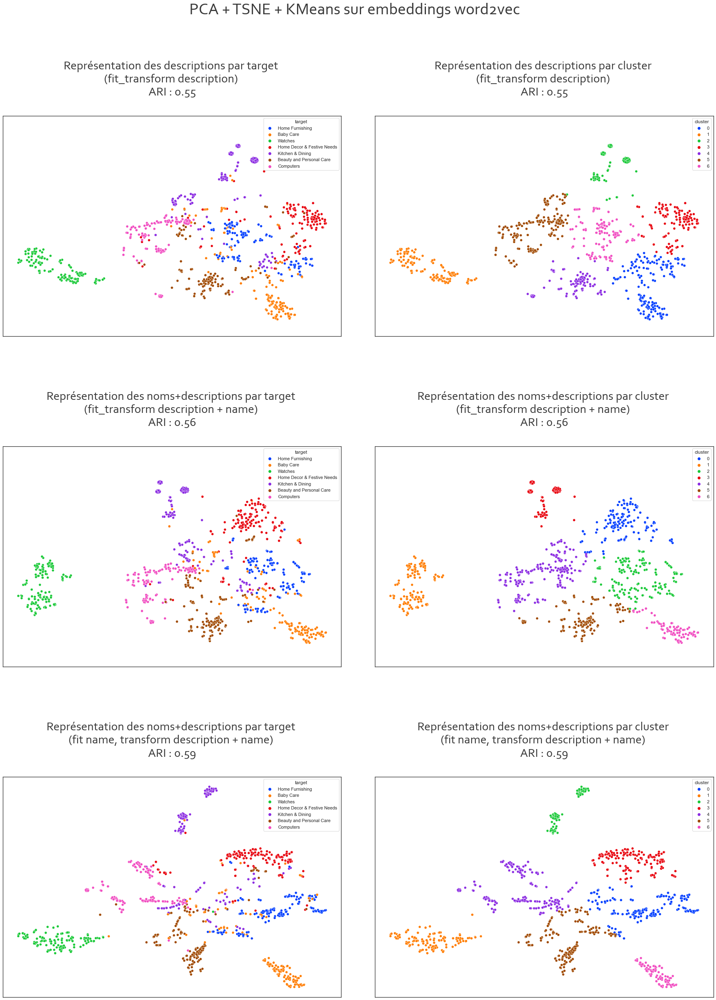

In [204]:
word2vec_reduced = toolbox.display_vizu_many(toolbox.LinearDimReduction.PCA,
                                             models_word2vec,
                                             products_subset['_target'],
                                             (25, 35), ' sur embeddings word2vec',
                                             top=0.87, hspace=.5,
                                             verbose=True)

<h5 style="font-family:Corbel Light; color:#737373">Matrices de confusion</h5>

Modèle 1 : entrainement sur les descriptions

Les modèles précédents entrainés sur les descriptions avaient tendance à classer à tort beaucoup d'articles de catégories différentes dans une catégorie en particulier ("Home Furnishing" pour les features tf et "Home Decor & Festive Needs" pour les features tf-idf). Ce n'est pas le cas avec les features obtenues par word embedding. 

Les principales erreurs commises par le modèle consiste à :
- classer des articles "Baby Care" en "Home Furnishing" et inversement. Cette difficulté à bien séparer ces deux classes est visible graphiquement. On voit bien qu'une partie des points représentant les articles bébé (en orange) et les articles d'ammeublement (en bleu) sont mélangés.
- classer des articles "Kitchen and Dining" en "Computers".

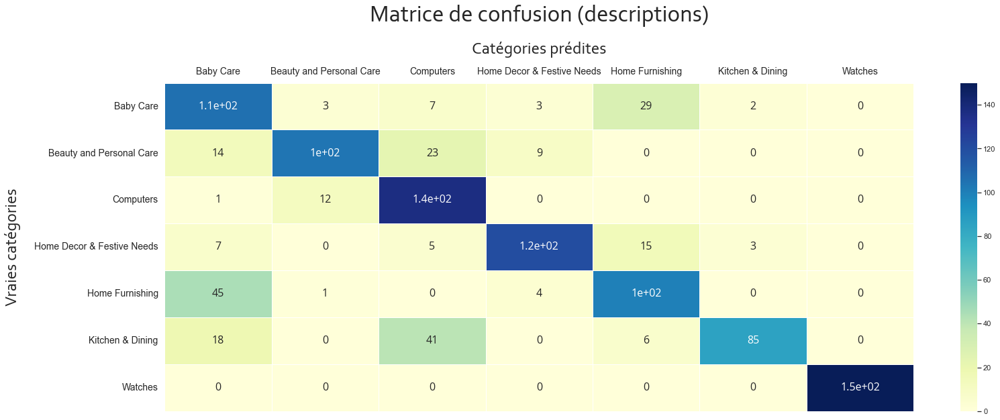

In [205]:
data_des_w2v = word2vec_reduced['fit_transform description']
data_des_w2v.rename(columns={"cluster": 'pred'}, inplace=True)

toolbox.plot_confusion_matrix(data_des_w2v, (25, 9),
                              add_label=True,
                              title=' (descriptions)'
                              )

Exemples d'articles "Home Furnishing" classés en "Baby Care" par erreur: nappes, housses de coussins ...

In [206]:
mismatch = data_des_w2v.loc[(data_des_w2v['target']=="Home Furnishing") & (data_des_w2v['pred']==0)]
print(mismatch.shape)
print(products_subset['_description_cleaned'][mismatch.index][7:10].values)

(45, 6)
['key prime seater tabl cover length 60 inch 152 cm width 40 inch 101 cm prime seater tabl cover multicolor pvc 499 prime center tabl cover seater prime seater tabl cover multicolor pvc box number content gener brand prime type tabl cover model name materi pvc model id multicolor dimens weight 250 length 60 inch 152 cm width 40 inch 101 cm capac seater'
 'key prime seater tabl cover length 90 inch 228 cm width 60 inch 152 cm prime seater tabl cover multicolor pvc 899 prime dine tabl cover seater prime seater tabl cover multicolor pvc box number content gener brand prime type tabl cover model name materi pvc model id multicolor dimens weight 550 length 90 inch 228 cm width 60 inch 152 cm capac seater'
 'key jaipur cotton floral diwan set colour hand superior qualiti jaipur cotton floral diwan set 499 nice beauti diwan set made citi king jaipur give royal look hous superior qualiti give hous new look royal diwan set made royal citi jaipur jaipur cotton floral diwan set gener bran

Exemples d'articles "Baby Care" classés en "Home Furnishing" par erreur: serviettes de bain, cadre photo ... 

(peut être que les mots "cotton", "wood" ont induit le modèle en erreur)

In [207]:
mismatch = data_des_w2v.loc[(data_des_w2v['target']=="Baby Care") & (data_des_w2v['pred']==6)]
print(mismatch.shape)
print(products_subset['_description_cleaned'][mismatch.index][:5].values)

(29, 6)
['tiddli bath set' 'cotton bath towel 449'
 'intellect bazaar cotton bath towel babi towel 649'
 'wood beauti wood photo frame 450 wood beauti wood photo frame best'
 'bornbabykid cotton bath towel']


Modèle 2 : Entrainement sur les noms de produit et les descriptions

Principales erreurs du modèles : 
- classer des articles "Kitchen and Dining" en "Computers" (comme pour le modèle entrainé sur les descriptions)

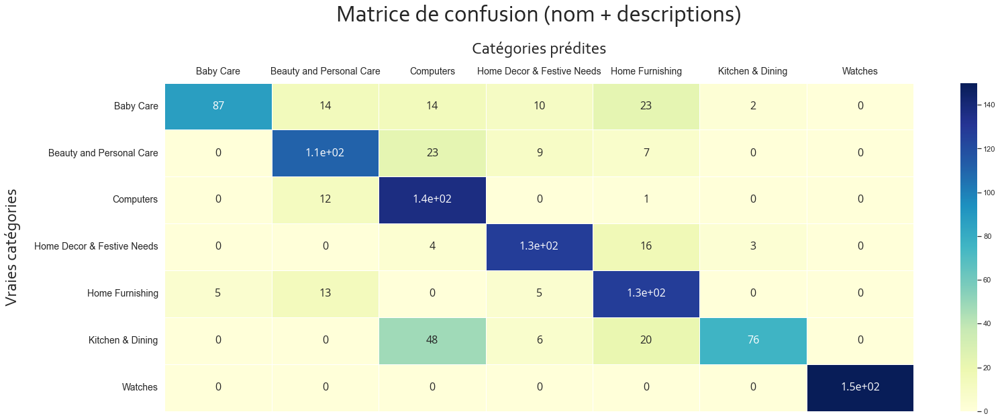

In [208]:
data_name_des_w2v = word2vec_reduced['fit_transform description + name']
data_name_des_w2v.rename(columns={"cluster": 'pred'}, inplace=True)

toolbox.plot_confusion_matrix(data_name_des_w2v, (25, 9),
                              add_label=True,
                              title=' (nom + descriptions)'
                              )

Exemples d'articles de cuisine classés en électronique : ampoules, couteaux à pizza ...

(peut-être que les mots "technology", "led" ont induit le modèle en erreur)

In [209]:
mask_kitchen = (data_name_des_w2v['target'] == "Kitchen & Dining")
mask_computers = (data_name_des_w2v['pred'] == 4)

mismatch = data_name_des_w2v.loc[mask_kitchen & mask_computers]
print(mismatch.shape)
print(products_subset['_name_and_description_cleaned']
      [mismatch.index][:5].values)

(48, 6)
['bft led bulbkey led bulb bulb led bulb white 350 introduc new technolog led light led best suit chandeli tabl lamp light fixtur gener spread light 360 degre led bulb white gener brand model number bodi materi glass bulb base light light white bulb type led 700 power power consumpt box bulb'
 'famou wheel pizza cutterfamou wheel pizza cutter steel 299 pizza cutter extra shape blade brand new high qualiti perfectli pizza cutter pizza pastri perform easi oper sharp edg perfect grip high qualiti compact size light weight conveni use new stylish pizza cutter cut pizza great eas blade made high qualiti stainless steel handl made high qualiti plastic scientif le cut durabl portabl easi carri beauti stylish model may vari accord avail pizza cutter perfectli pizza cutter perfect grip cut pizza cutter extra sharp blade best grip cut compact size light weight conveni use pizza cutter extra shape blade brand new high qualiti perfectli pizza cutter pizza pastri perform easi oper sharp edg

Modèle 3 : entrainement sur les noms de produits

Ce modèle semble avoir du mal à prédire correctement les articles "Kitchen & Dining", en particulier il les confond beaucoup avec des articles de la classe "Computers". De même, les articles "Baby Care" sont souvent classés dans les mauvaises catégories, en particulier dans la catégorie "Home Furnishing".

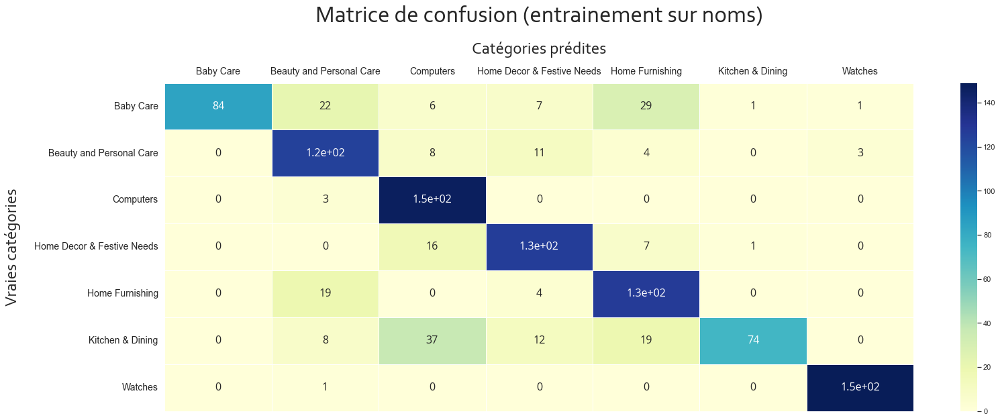

In [210]:
data_name_w2v = word2vec_reduced['fit name, transform description + name']
data_name_w2v.rename(columns={"cluster": 'pred'}, inplace=True)

toolbox.plot_confusion_matrix(data_name_w2v, (25, 9),
                              add_label=True,
                              title=' (entrainement sur noms)'
                              )

Exemples d'articles "Kitchen & Dining" classés en "Computers": couteaux à pizza (peut-être à cause des mots 'wheel', 'cutter').

In [211]:
mask_kitchen = (data_name_w2v['target'] == "Kitchen & Dining")
mask_computers = (data_name_w2v['pred'] == 4)

mismatch = data_name_w2v.loc[mask_kitchen & mask_computers]
print(mismatch.shape)
print(products_subset['_name_cleaned'][mismatch.index][:10].values)

(37, 6)
['bft led bulb' 'famou wheel pizza cutter' 'sam roll pizza cutter'
 'step4deal wheel pizza cutter' 'tirupati green wheel pizza cutter'
 'king intern ergonom design long grip handl roll pizza cutter'
 'go hook wheel pizza cutter' 'apex roll pizza cutter'
 'agromech yiboo roll pizza cutter' 'jsm hard anod kadhai']


Exemples d'articles "Baby Care" classés en "Home Furnishing": serviettes de bain, couvertures .. (peut-être à cause des mots "cotton", "plastic").

In [212]:
mask_baby = (data_name_w2v['target'] == "Baby Care")
mask_home = (data_name_w2v['pred'] == 0)

mismatch = data_name_w2v.loc[mask_baby & mask_home]
print(mismatch.shape)
print(products_subset['_name_cleaned'][mismatch.index][:10].values)

(29, 6)
['sathiya cotton bath towel' 'eurospa cotton terri face towel set'
 'kohl wine bag yellow' 'graco literid click connect marco'
 'tk cotton hair towel' 'boreal plastic rectangular hair brush 633d'
 'portia polka print trendi cap'
 'cotton plastic diaper reuseabl pad small blue'
 'offspr solid singl blanket pink' 'offspr print singl blanket blue']


<h4 style="font-family:Corbel Light; color:#737373">BERT</h4>

<h5 style="font-family:Corbel Light; color:#737373">Extraction de features</h5>

**TensorflowHub**

In [213]:
logging.set_verbosity_error()

In [214]:
model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
bert_tfhub = hub.KerasLayer(model_url, trainable=True)

Modèle 1 : Entrainement sur les descriptions

In [215]:
descriptions_raw = products_subset['description'].to_list()

In [216]:
%%time
embeddings_bert_tf_descriptions = toolbox.get_embeddings_bert(bert_tfhub, 'bert-base-uncased',
                                                              descriptions_raw, 64, 10,
                                                              toolbox.BertMode.TENSORFLOW_HUB)

CPU times: total: 10min 55s
Wall time: 4min 30s


In [217]:
embeddings_bert_tf_descriptions.shape

(1050, 768)

Modèle 2 : Entrainement sur les noms de produits et descriptions

In [218]:
name_and_descriptions_raw = products_subset['_name_and_description'].to_list()

In [219]:
%%time
embeddings_bert_tf_name_descriptions = toolbox.get_embeddings_bert(bert_tfhub, 'bert-base-uncased',
                                                                   name_and_descriptions_raw, 64, 10,
                                                                   toolbox.BertMode.TENSORFLOW_HUB)

CPU times: total: 11min 15s
Wall time: 4min


In [220]:
embeddings_bert_tf_name_descriptions.shape

(1050, 768)

Modèle 3 : Entrainement sur les noms de produits

In [221]:
names_raw = products_subset['product_name'].to_list()

In [222]:
%%time
embeddings_bert_tf_name = toolbox.get_embeddings_bert(bert_tfhub, 'bert-base-uncased',
                                                      names_raw, 64, 10,
                                                      toolbox.BertMode.TENSORFLOW_HUB)

CPU times: total: 11min 27s
Wall time: 3min 59s


In [223]:
embeddings_bert_tf_name.shape

(1050, 768)

**HuggingFace**

In [224]:
model_hf = TFAutoModel.from_pretrained('bert-base-uncased')

Modèle 1 : entrainement sur les descriptions

In [225]:
%%time
embeddings_bert_hf_descriptions = toolbox.get_embeddings_bert(model_hf, 'bert-base-uncased',
                                                              descriptions_raw, 64, 10,
                                                              toolbox.BertMode.HUGGINGFACE)

CPU times: total: 12min 36s
Wall time: 4min 58s


In [226]:
embeddings_bert_hf_descriptions.shape

(1050, 768)

Modèle 2 : entrainement sur les noms de produit et les descriptions

In [227]:
%%time
embeddings_bert_hf_name_description = toolbox.get_embeddings_bert(model_hf, 'bert-base-uncased',
                                                                  name_and_descriptions_raw, 64, 10,
                                                                  toolbox.BertMode.HUGGINGFACE)

CPU times: total: 12min 37s
Wall time: 4min 59s


In [228]:
embeddings_bert_hf_name_description.shape

(1050, 768)

Modèle 3 : entrainement sur les noms de produit

In [229]:
%%time
embeddings_bert_hf_name = toolbox.get_embeddings_bert(model_hf, 'bert-base-uncased', 
                                                      names_raw, 64, 10, 
                                                      toolbox.BertMode.HUGGINGFACE)

CPU times: total: 12min 37s
Wall time: 5min 2s


In [230]:
embeddings_bert_hf_name.shape

(1050, 768)

**Specifique**

Essayons de voir si on obtient de meilleurs résultats avec un modèle pré-entrainé sur des requêtes de produits Amazon

In [231]:
model_type = "LiYuan/amazon-query-product-ranking"
model_amazon = TFAutoModel.from_pretrained("LiYuan/amazon-query-product-ranking", from_pt=True)

Modèle 1 : entrainement sur les descriptions

In [232]:
%%time
embeddings_bert_amazon_descriptions = toolbox.get_embeddings_bert(model_amazon, model_type,
                                                                  descriptions_raw, 64, 10,
                                                                  toolbox.BertMode.HUGGINGFACE)

CPU times: total: 6min 29s
Wall time: 2min 39s


In [233]:
embeddings_bert_amazon_descriptions.shape

(1050, 768)

Modèle 2 : entrainement sur les noms de produit et les descriptions

In [234]:
%%time
embeddings_bert_amazon_names = toolbox.get_embeddings_bert(model_amazon, model_type,
                                                           name_and_descriptions_raw, 64, 10,
                                                           toolbox.BertMode.HUGGINGFACE)

CPU times: total: 6min 27s
Wall time: 2min 36s


In [235]:
embeddings_bert_amazon_names.shape

(1050, 768)

Modèle 3 : entrainement sur les noms de produits

In [236]:
%%time
embeddings_bert_amazon_names_des = toolbox.get_embeddings_bert(model_amazon, model_type,
                                                               names_raw, 64, 10,
                                                               toolbox.BertMode.HUGGINGFACE)

CPU times: total: 6min 29s
Wall time: 2min 43s


In [237]:
embeddings_bert_amazon_names_des.shape

(1050, 768)

<h5 style="font-family:Corbel Light; color:#737373">Réduction en 2 dimensions</h5>

**Réduction dimensions - CE2 Vous avez appliqué une méthode de réduction de dimension adaptée à la problématique (ex. : ACP).**

Notre matrice de features est dense donc nous pouvons appliquer l'analyse en composantes principales cette fois-ci, de telle sorte que les composantes retenues expliquent au moins 80% de la variance totale.

Modèles 1 : entrainement sur les descriptions d'articles

In [238]:
models_bert = [{'data': embeddings_bert_tf_descriptions,
                'title': 'descriptions',
                'model': 'model from tensorflow_hub',
                'n_components': 0.98},
               {'data': embeddings_bert_hf_descriptions,
                'title': 'descriptions',
                'model': 'model from huggingface',
                'n_components': 0.98},
               {'data': embeddings_bert_amazon_descriptions,
                'title': 'descriptions',
                'model': 'huggingface model trained on amazon products',
                'n_components': 0.98}
               ]

On obtient de moins bons scores qu'avec les features précédentes (word2vec, tf-idf, tf), peut-être car nous avons fixé la taille maximum des documents à 64 tokens. On perd donc une bonne partie des descriptions les plus longues. 

98.01% de variance expliquée par les 265 composantes ensembles
98.01% de variance expliquée par les 265 composantes ensembles
98.00% de variance expliquée par les 242 composantes ensembles


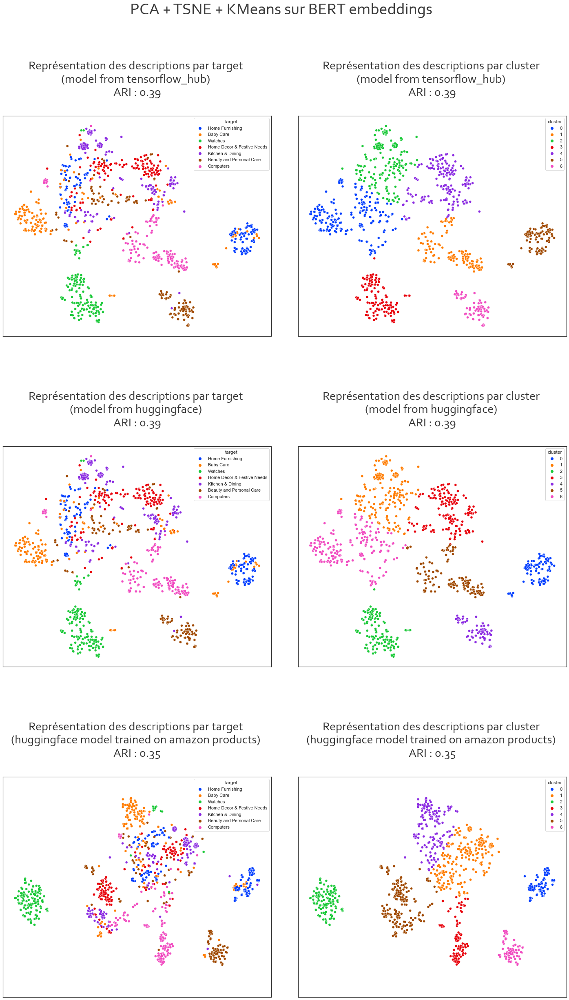

In [239]:
bert_description_reduced = toolbox.display_vizu_many(toolbox.LinearDimReduction.PCA,
                                                     models_bert,
                                                     products_subset['_target'],
                                                     (20, 35),
                                                     ' sur BERT embeddings',
                                                     top=0.87, hspace=.5,
                                                     verbose=True)

Modèles 2 : Entrainement sur les descriptions et noms de produits

Les scores ARI sont meilleurs que ceux des modèles ci-dessus entrainés uniquement sur les descriptions. Cependant, on obtient des résultats moins bons qu'avec les embeddings word2vec (0.56).

In [240]:
models_bert_name_des = [{'data': embeddings_bert_tf_name_descriptions,
                         'title': 'noms de produits et descriptions', 
                         'model': 'model from tensorflow_hub',
                         'n_components': 0.99},
                        {'data': embeddings_bert_hf_name_description,
                         'title': 'noms de produits et descriptions',
                         'model': 'model from huggingface',
                         'n_components': 0.99},
                        {'data': embeddings_bert_amazon_names_des,
                         'title': 'noms de produits et descritpions',
                         'model': 'huggingface model trained on amazon products',
                         'n_components': 0.99}
                        ]

99.01% de variance expliquée par les 378 composantes ensembles
99.00% de variance expliquée par les 377 composantes ensembles
99.00% de variance expliquée par les 422 composantes ensembles


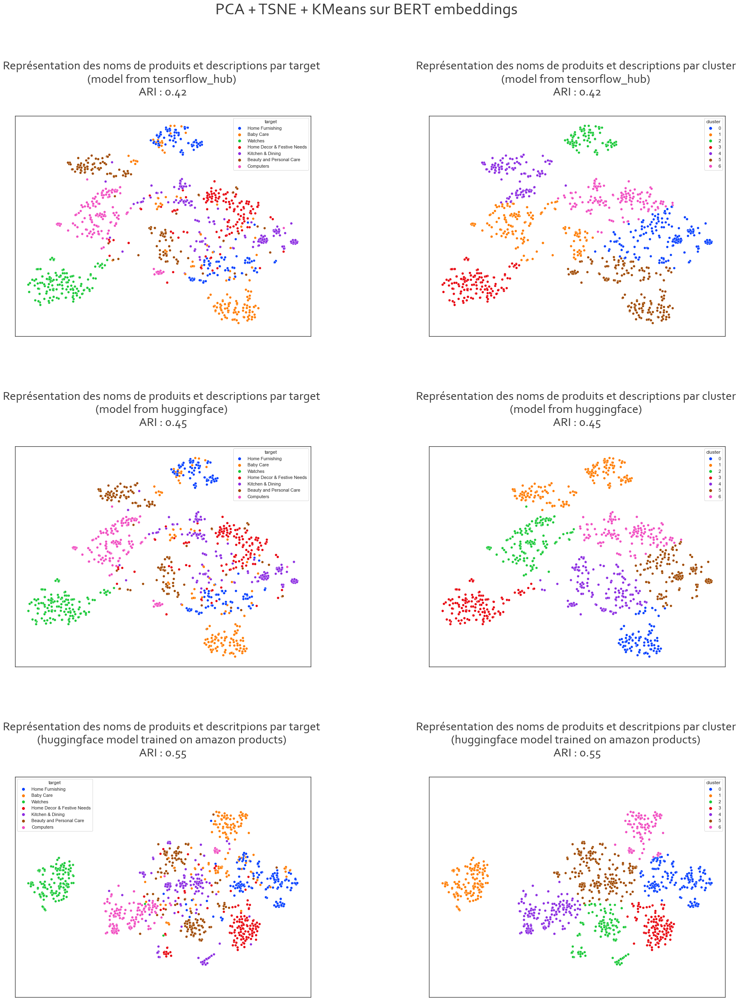

In [241]:
bert_name_des_reduced = toolbox.display_vizu_many(toolbox.LinearDimReduction.PCA,
                                                  models_bert_name_des,
                                                  products_subset['_target'],
                                                  (25, 35),
                                                  ' sur BERT embeddings',
                                                  top=0.87, hspace=.5, wspace=.4,
                                                  verbose=True
                                                  )

Modèles 3 : entrainement sur les noms de produits

On obtient des résultats similaires au modèle entrainé avec les embeddings word2vec (0.59), sauf pour le modèle utilisant les embeddings issus d'un modèle pré-entrainé avec des produits Amazon.

In [242]:
models_bert_name = [{'data': embeddings_bert_tf_name,
                     'title': 'noms de produits', 'model':
                     'model from tensorflow_hub',
                     'n_components': 0.99},
                    {'data': embeddings_bert_hf_name,
                     'title': 'noms de produits',
                     'model': 'model from huggingface',
                     'n_components': 0.99},
                    {'data': embeddings_bert_amazon_names,
                     'title': 'noms de produits',
                     'model': 'huggingface model trained on amazon products',
                     'n_components': 0.99}
                    ]

99.00% de variance expliquée par les 388 composantes ensembles
99.00% de variance expliquée par les 388 composantes ensembles
99.01% de variance expliquée par les 335 composantes ensembles


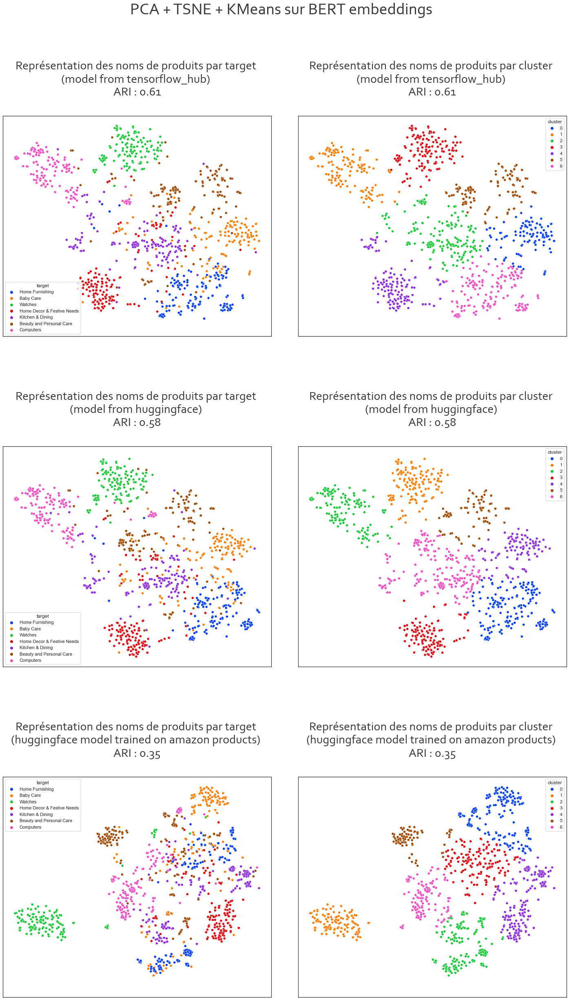

In [243]:
bert_name_reduced = toolbox.display_vizu_many(toolbox.LinearDimReduction.PCA,
                                              models_bert_name,
                                              products_subset['_target'],
                                              (20, 35),
                                              ' sur BERT embeddings',
                                              top=0.87, hspace=.5,
                                              verbose=True
                                              )

<h5 style="font-family:Corbel Light; color:#737373">Matrices de confusion</h5>

Pour chaque type de modèle (i.e entrainement sur les descriptions, les noms ou les deux) on ne va afficher la matrice de confusion que du meilleur.

Modèle 1: entrainement sur les descriptions - bert from tensorflow_hub

On voit bien qu'il n'est pas très bon, en particulier beaucoup d'articles sont classés par erreur en "Kitchen & Dining" et "Baby Care".

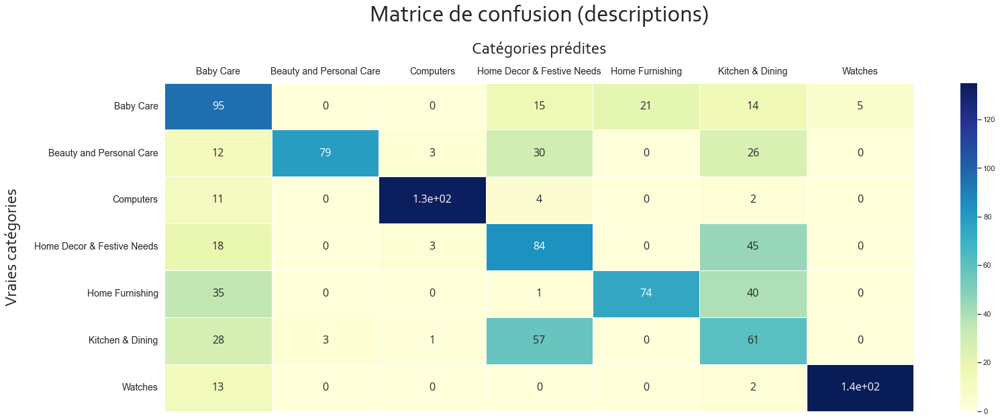

In [244]:
data_des_bert = bert_description_reduced['model from tensorflow_hub']
data_des_bert.rename(columns={"cluster": 'pred'}, inplace=True)

toolbox.plot_confusion_matrix(data_des_bert, (25, 9),
                              add_label=True,
                              title=' (descriptions)')

Modèle 2 : entrainement sur descriptions et noms - modèle DistilBert préentrainé sur des requêtes de produits amazon

La principale erreur du modèle est de classer des articles "Beauty and Personal Care" en "Kitchen and Dining"

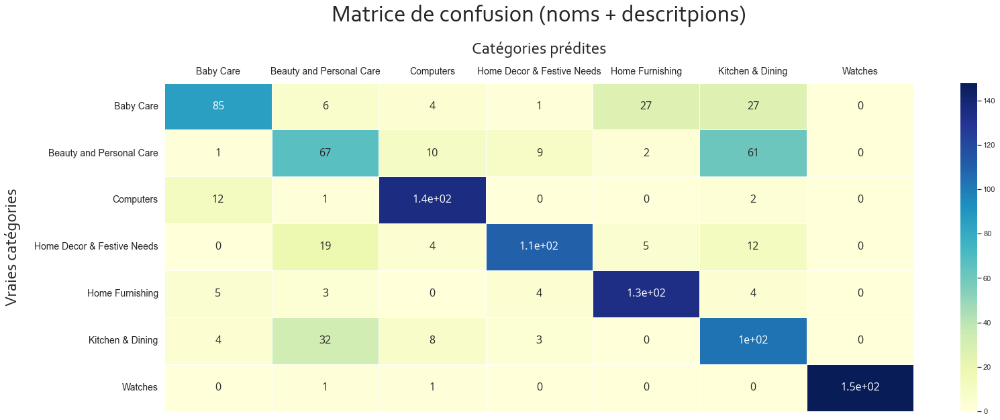

In [245]:
data_name_des_bert = bert_name_des_reduced['huggingface model trained on amazon products']
data_name_des_bert.rename(columns={"cluster": 'pred'}, inplace=True)

toolbox.plot_confusion_matrix(data_name_des_bert, (25, 9),
                              add_label=True,
                              title=' (noms + descritpions)')

Modèle 3 : Entrainement sur les noms de produits - modèle bert chargé depuis tensorflow_hub

La principale erreur du modèle consite à classer beaucoup d'articles d'autres catégories dans la catégorie "Kitchen & Dining"

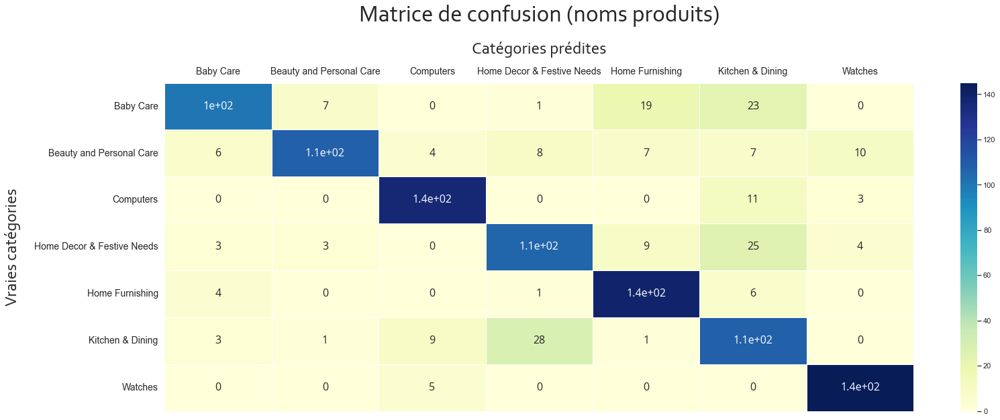

In [246]:
data_name_bert = bert_name_reduced['model from tensorflow_hub']
data_name_bert.rename(columns={"cluster": 'pred'}, inplace=True)

toolbox.plot_confusion_matrix(data_name_bert, (25, 9),
                              add_label=True,
                              title=' (noms produits)')

<h4 style="font-family:Corbel Light; color:#737373">Universal Sentence Encoder</h4>

<h5 style="font-family:Corbel Light; color:#737373">Extraction de features</h5>

In [247]:
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

Modèle 1 : entrainement sur les descriptions

In [248]:
embeddings_use_description = toolbox.get_embeddings_use(embed,
                                                        descriptions_raw,
                                                        10)
embeddings_use_description.shape

(1050, 512)

Modèle 2 : entrainement sur les descriptions et les noms de produits

In [249]:
embeddings_use_name_description = toolbox.get_embeddings_use(embed,
                                                             name_and_descriptions_raw,
                                                             10)
embeddings_use_name_description.shape

(1050, 512)

Modèle 3 : entrainement sur les noms de produits

In [250]:
embeddings_use_name = toolbox.get_embeddings_use(embed, names_raw, 10)
embeddings_use_name.shape

(1050, 512)

<h5 style="font-family:Corbel Light; color:#737373">Réduction en 2 dimensions</h5>

In [251]:
models_use = [{'data': embeddings_use_description, 
               'title': 'descriptions', 
               'model': 'fit_transform description', 
               'n_components': 0.98},
               {'data': embeddings_use_name_description, 
                'title': 'noms et descriptions', 
                'model':'fit_transform description + name', 
                'n_components': 0.98},
               {'data': embeddings_use_name, 
                'title': 'noms de produits', 
                'model' : 'fit_transform name', 
                'n_components': 0.98}
               ]

Le cluster des montres est encore une fois le cluster le mieux formé (en vert sur les graphiques de gauche).

On obtient le score ARI le plus élevé de tous les modèles testés jusqu'à présent lorsque l'on entraine le modèle sur les noms des produits uniquement.

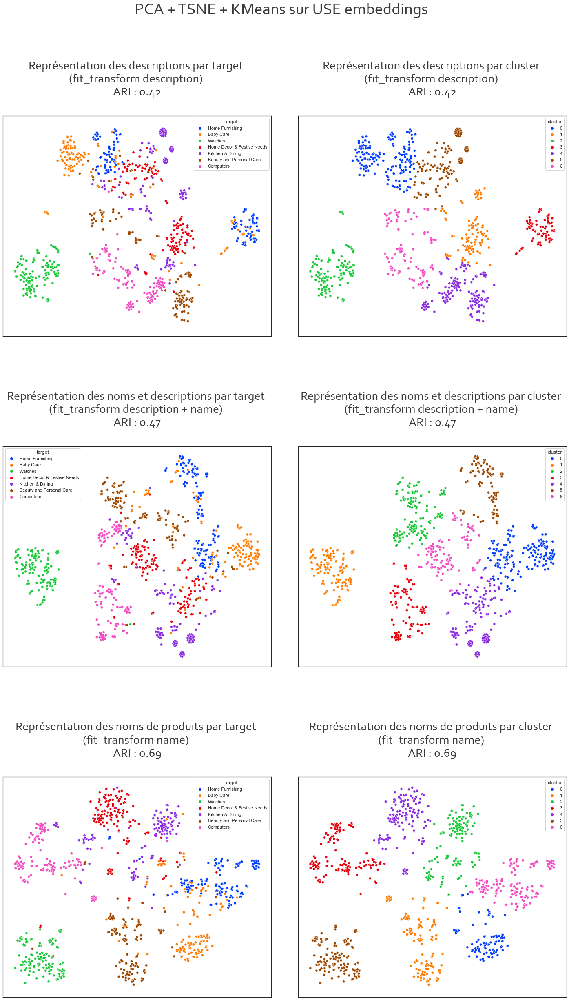

In [252]:
use_reduced = toolbox.display_vizu_many(toolbox.LinearDimReduction.PCA, models_use, 
                                        products_subset['_target'], (20, 35), 
                                        ' sur USE embeddings', 
                                        top=0.87, hspace=.5,
                                        )

<h5 style="font-family:Corbel Light; color:#737373">Matrices de confusion</h5>

Modèle 1 : entrainement sur les descriptions

Principales erreurs du modèle : 
- articles "Home Furnishing" classés en "Baby Care"
- articles "Computers" classés en "Beauty and Personal Care" et inversement. Sur le graphique de gauche, on voit que la moitié des produits étiquetés dans la catégorie "beauté" forment un cluster marron proche du cluster rose formé par les produits étiquetés "computers".Le modèle regroupe ces points en un même cluster violet visible sur le graphique de droite.
- articles "Home Decor and Festive Needs" classés en "Kitchen and Dining"

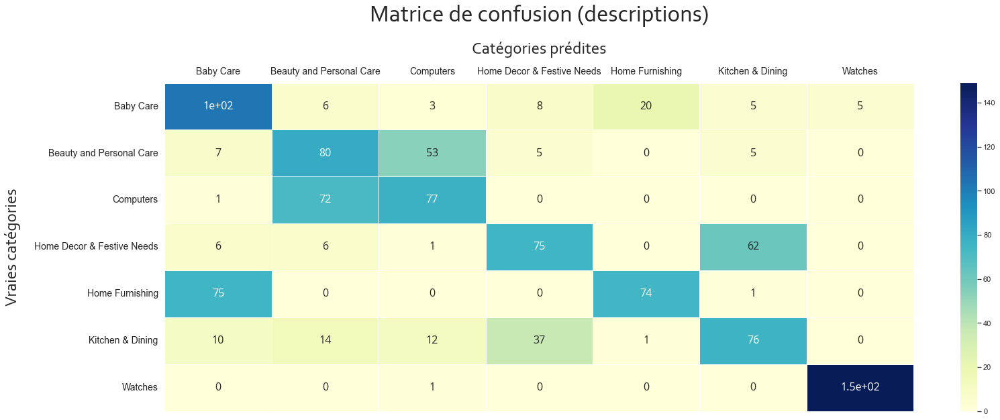

In [253]:
data_des_use = use_reduced['fit_transform description']
data_des_use.rename(columns={"cluster": 'pred'}, inplace=True)

toolbox.plot_confusion_matrix(data_des_use, (25, 9),
                              add_label=True,
                              title=' (descriptions)')

Modèle 2 : entrainement sur les noms de produits et les descriptions

Principales erreurs commises par le modèle : à peu près les mêmes erreurs que le modèle précédent
- articles "Home Furnishing" classés en "Baby Care"
- articles "Home Decor and Festive Needs" classés en "Kitchen and Dining"
- articles "Beauty and Personal Care" en "Home Decor and Festive Needs

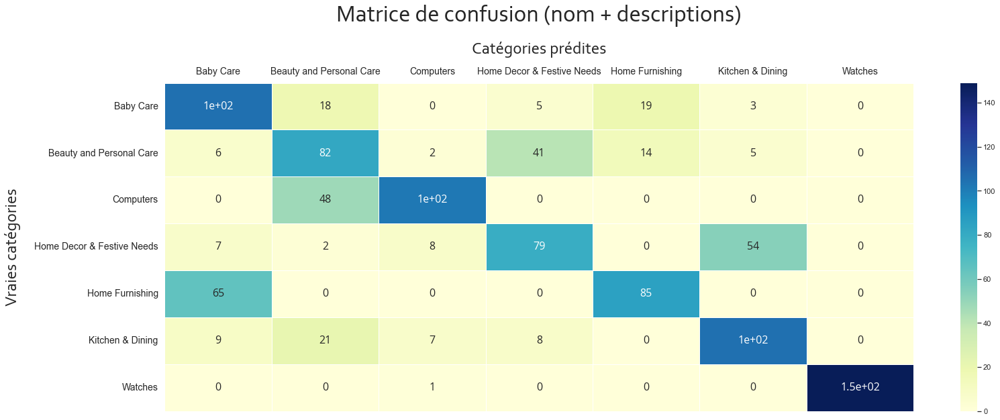

In [254]:
data_des_name_use = use_reduced['fit_transform description + name']
data_des_name_use.rename(columns={"cluster": 'pred'}, inplace=True)

toolbox.plot_confusion_matrix(data_des_name_use, (25, 9),
                              add_label=True,
                              title=' (nom + descriptions)')

Modèle 3 : entrainement sur les noms de produits

Principales erreurs du modèle : 
- articles "Kitchen & Dining" classés en "Home and Festive Needs"
- articles "Baby Care" classés en "Home Furnishing"

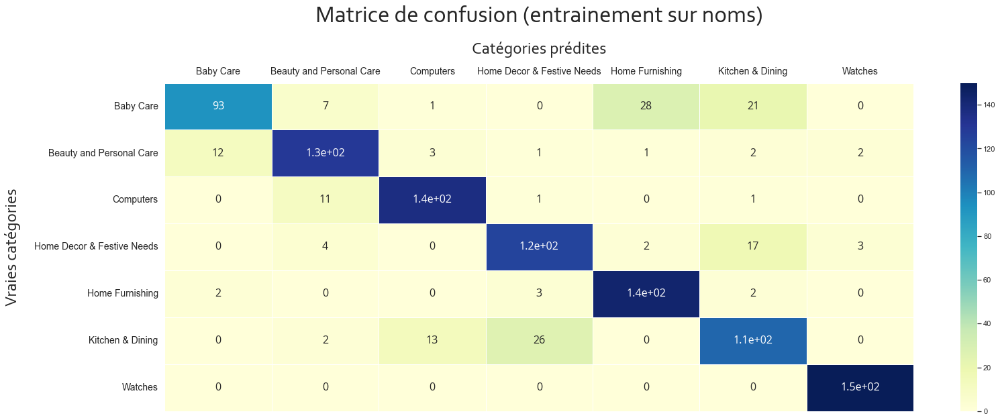

In [255]:
data_name_use = use_reduced['fit_transform name']
data_name_use.rename(columns={"cluster": 'pred'}, inplace=True)

toolbox.plot_confusion_matrix(data_name_use, (25, 9),
                              add_label=True,
                              title=' (entrainement sur noms)')

<h3 style="font-family:Corbel Light; color:#737373">Conclusion</h3>

En résumé :

Nous avons rapidement et facilement réussi à obtenir des partitions au moins à moitié semblables à la partition originale sans utiliser des méthodes très compliquées, ni des hyperparamètres optimisés. Il semble donc faisable de classer des articles automatiquement à partir de leur nom et/ou description.

A noter qu'il semble plus facile de classer les articles par catégorie en utilisant aussi les noms de produits plutôt que les descriptions seules. On obtient ainsi des scores ARI plus élevés, au dessus de 0.6.

En utilisant la méthode de comptage direct tfd-idf on obtient des scores ARI supérieurs à 0.5, mais ce sont des modèles de word embedding qui permettent d'obtenir les meilleurs résultats.

Si on veut vraiment utiliser les descriptions, Word2Vec donne les meilleurs résultats. Mais si on décide de n'utiliser que les noms de produits, des modèles USE ou Bert pré-entrainés semblent plus appropriés pour faire du word embedding.

Concernant les erreurs qui reviennent le plus, le jeu de données contient 3 catégories un peu "fourre-tout" dans lesquelles les modèles classent beaucoup d'articles d'autres catégories.

- Catégorie "Home Furnishing" : 
    on voit que les modèles qui utilisent les features tf ont du mal à distinguer clairement la catégorie "Home Furnishing" dans laquelle ils classent beaucoup d'articles qui n'y appartiennent pas. Cette catégorie pose également problème aux modèles utilisant les features obtenues par Word2Vec et USE qui ont du mal à distinguer les produits "Home Furnishing" des produits "Baby Care". 

- Catégorie "Home Decor and Festive Needs" :
    les modèles qui utilisent les features tf-idf en particulier rattachent beaucoup de produits d'autres catégories à cette classe. Les modèles utilisant les features tf classent beaucoup de produits "Home Furnishing" dans cette catégorie, tandis que les modèles utilisant les features USE confondent les produits "Kitchen & Dining" avec cette catégorie. 
    
- Catégorie "Kitchen & Dining" :
    beaucoup de modèles rencontrent des difficultés avec cette catégorie, soit parce qu'ils classent des produits qui n'y appartiennent pas (bert et use), soit parce qu'ils classent des produits "Kitchen" dans d'autres catégories, en particulier dans la catégorie "Computers" (word2vec et tf).
    
    
Enfin la catégorie "montres" est la plus facile à identifier.

In [256]:
models = {'tf': tf_reduced, 'tf_idf': tfidf_reduced,
          'w2v': word2vec_reduced, 'use': use_reduced}
bert = {'fit_transform description': bert_description_reduced,
        'fit_transform description + name': bert_name_des_reduced,
        'fit_transform name,': bert_name_reduced}

df_data = []
for model, data_dict in models.items():
    for train_set, data in data_dict.items():
        df_data.append({'model': model, 
                        'train_set': train_set, 
                        'ari': data['ari'][0]})

for train_set, data_dict in bert.items():
    for model, data in data_dict.items():
        df_data.append({'model': model,
             'train_set': train_set, 
             'ari': data['ari'][0]})
        
df = pd.DataFrame(df_data)

In [257]:
df.sort_values('ari', ascending=False).head(30)

,model,train_set,ari
11,use,fit_transform name,0.69
18,model from tensorflow_hub,"fit_transform name,",0.61
8,w2v,"fit name, transform description + name",0.59
19,model from huggingface,"fit_transform name,",0.58
7,w2v,fit_transform description + name,0.56
6,w2v,fit_transform description,0.55
17,huggingface model trained on amazon products,fit_transform description + name,0.55
4,tf_idf,fit_transform description + name,0.55
5,tf_idf,"fit name, transform description + name",0.54
3,tf_idf,fit_transform description,0.54
